# 4. 분석 및 모델링 단계

## 1) EDA (탐색적 데이터 분석)
- **분포 확인**:  
  - 히스토그램, 박스플롯, KDE 시각화를 통해 매매가격, 전용면적, 평당가격 등의 분포를 확인하고, 로그 변환 및 이상치 제거의 효과를 평가합니다.
- **상관관계 분석**:  
  - 변수 간 상관관계 행렬(Heatmap)을 통해 주요 변수들(예: 전용면적, 평당가격, 건축년도, 전월세전환율 등)이 매매가격에 미치는 영향을 정량적으로 확인합니다.

## 2) 회귀 분석 및 다중공선성 평가
- **OLS 회귀 모델**:  
  - 주요 독립 변수와 매매가격(`dealAmount`) 간의 관계를 OLS 회귀분석으로 모델링하고, 결정계수(R²)와 계수의 유의성을 확인합니다.
- **VIF (분산 팽창 계수)**:  
  - 다중공선성 문제를 확인하기 위해 VIF를 계산하며, 상수항을 제외한 주요 변수들의 VIF가 낮은 것을 확인해 모델 안정성을 평가합니다.
- **Ridge 회귀**:  
  - Ridge 회귀 모델을 사용하여 규제 항목을 포함시켜, 과적합을 줄이고 변수 계수의 안정성을 개선하는 방법을 시도합니다.

## 3) 시계열 분석
- **연도별 및 월별 분석**:  
  - `dealDate`를 기준으로 연도별, 월별 평균 매매가격 및 거래 건수를 산출하여, 시계열 트렌드와 계절성을 확인합니다.
- **시계열 시각화 및 분해**:  
  - 선 그래프와 막대 그래프를 통해 거래 가격과 거래량의 추이를 시각화하고, Seasonal Decomposition을 적용해 트렌드, 계절성, 불규칙 요인을 분리합니다.
- **이동평균 적용**:  
  - 단기 변동을 완화하기 위해 이동평균을 계산하여 장기 추세를 부드럽게 파악합니다.

## 4) 공간적 분석
- **클러스터링 (공구 분류)**:  
  - K-Means 클러스터링을 통해 도출한 ‘zone’ 변수는 실제 행정 구역(공구)와 유사한 군집을 형성하는지 확인할 수 있으며, 이를 지도에 시각화하여 공간적 분포를 파악합니다.

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.neighbors import BallTree
from scipy.spatial import cKDTree

In [ ]:
import matplotlib.font_manager as fm

fm._get_font.cache_clear()
fm.fontManager = fm.FontManager()

### 1. 데이터 로드

In [ ]:
import pandas as pd
apt_df = pd.read_csv('fin_apt2.csv')
rate_df = pd.read_csv('fin_rate.csv')
transport_df = pd.read_csv('fin_transport5.csv')
convenience_df = pd.read_csv('fin_convenience5.csv')
gtx_df = pd.read_csv("gtx_issue.csv", encoding='utf-8-sig')
population_excel = "행정구역_읍면동_별_5세별_주민등록인구_2011년__20250321214634.xlsx"

In [ ]:
print(apt_df.info())
print(rate_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24642 entries, 0 to 24641
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sdNm                  24642 non-null  object 
 1   sggNm                 24642 non-null  object 
 2   umdNm                 24642 non-null  object 
 3   jibun                 24642 non-null  object 
 4   aptNm                 24642 non-null  object 
 5   excluUseAr            24642 non-null  float64
 6   dealDate              24642 non-null  object 
 7   dealAmount            24642 non-null  float64
 8   pricePerpy            24642 non-null  float64
 9   floor                 24642 non-null  int64  
 10  buildYear             24642 non-null  int64  
 11  year_month            24642 non-null  float64
 12  rent_conversion_rate  24642 non-null  float64
 13  full_address          24642 non-null  object 
 14  latitude              24642 non-null  float64
 15  longitude          

### 2. 데이터 통계 분석 및 이상치 처리

#### 2.1 날짜 변수 생성

In [ ]:
apt_df['dealDate'] = pd.to_datetime(apt_df['dealDate'])
apt_df['year'] = apt_df['dealDate'].dt.year.astype(str)
apt_df['year_month'] = apt_df['dealDate'].dt.to_period('M')

#### 2.2 기초 통계

In [ ]:
apt_df.describe()

,excluUseAr,dealDate,dealAmount,pricePerpy,floor,buildYear,rent_conversion_rate,latitude,longitude
count,24642.000000,24642,24642.000000,24642.000000,24642.000000,24642.000000,24642.000000,24642.000000,24642.000000
mean,96.932846,2020-03-04 01:48:27.523739904,64364.257447,2257.949898,16.450897,2012.564727,4.994972,37.390322,126.646676
min,32.458400,2015-01-01 00:00:00,22000.000000,860.215100,1.000000,2005.000000,4.400000,37.370494,126.611763
25%,84.531700,2018-01-06 00:00:00,50000.000000,1678.737700,8.000000,2009.000000,4.600000,37.381197,126.640907
50%,84.960000,2020-02-22 00:00:00,59900.000000,2103.481400,14.000000,2013.000000,4.700000,37.391041,126.648274
75%,114.700800,2022-03-09 00:00:00,73000.000000,2728.751500,24.000000,2016.000000,5.600000,37.397747,126.654911
max,295.707100,2024-12-31 00:00:00,450000.000000,5786.090000,63.000000,2024.000000,6.200000,37.415777,126.674967
std,25.870557,NaN,22987.593415,712.521354,11.294022,4.467911,0.539475,0.011757,0.013731


In [ ]:
apt_df = pd.read_csv('fin_apt2.csv')
apt_df['dealDate'] = pd.to_datetime(apt_df['dealDate'])
apt_df['year'] = apt_df['dealDate'].dt.year.astype(str)
apt_df['year_month'] = apt_df['dealDate'].dt.to_period('M')

# 1. 숫자형 컬럼 선택 및 전체 분포 확인
numeric_columns = apt_df.select_dtypes(include=['float64', 'int64']).columns
print("숫자형 컬럼:", numeric_columns)

# 서브플롯 행/열 개수
n_cols = 4  # 열 수를 늘려서 줄 세로로 덜 길게
n_rows = -(-len(numeric_columns) // n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3 * n_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    apt_df[col].hist(bins=30, edgecolor='black', color=navipalette["ocean_blue"], ax=axes[i])
    axes[i].set_title(col, fontsize=10)
    axes[i].tick_params(labelsize=8)  # 축 눈금 작게

# 안 쓰는 축 없애기
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Distribution of All Numeric Columns", fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  # 제목 영역 확보
plt.show()

숫자형 컬럼: Index(['excluUseAr', 'dealAmount', 'pricePerpy', 'floor', 'buildYear',
       'rent_conversion_rate', 'latitude', 'longitude'],
      dtype='object')


NameError: name 'plt' is not defined

#### 해석
1. 히스토그램 & KDE 분석: 데이터가 오른쪽으로 긴 꼬리를 가진 분포(비대칭적)  
- 대부분의 아파트 가격이 10만 ~ 15만 사이에 집중되어 있습니다.  
- 고가 아파트(20만 이상) 는 상대적으로 적지만 존재합니다.  
2. 박스플롯 분석: 극단적인 이상치 다수 확인됩니다.  
- 10만 이상부터 이상치로 간주될 가능성이 큽니다.  
- 몇 개의 데이터가 40만 이상으로 아주 높게 형성되어 있습니다.  

# **--------------------------------------**
1. **데이터 전처리 및 이상치 제거**  
   - ✔ **로그 변환 적용**  
     → 매매가가 한쪽으로 치우친 분포를 보였으므로, 로그 변환을 통해 분포가 보다 정규분포에 가까워집니다.  
   - ✔ **IQR 방법으로 이상치 제거**  
     → 사분위 범위(IQR)에 1.5배 또는 2~3배 등을 적용해 극단적으로 높거나 낮은 거래를 제거, 분석 신뢰성 향상할 수 있습니다.  

   **📌 결과**: 로그 변환과 IQR 방식의 이상치 제거로 인해, 데이터가 지나치게 치우친 부분이 완화되어 **보다 안정적인 분포**를 가지게 됩니다.

**인사이트 및 다음 단계**  
1. **로그 변환 후에도 초고가가 남아 있는 이유**  
   - IQR 방식은 일정 기준(IQR×1.5 등)을 넘어서는 값을 이상치로 분류하지만, **시장 자체에서 형성된 고가 매물**은 자동으로 제거되지 않습니다.  
   - 송도 지역 특성상 초고가 단지가 존재할 수 있으므로, **모든 고가 거래를 이상치로 처리하는 것은 부적절할 수도 있습니다**.  

2. **대안적 필터링 기준 조정**  
   - 이상치 기준을 2.0IQR 또는 3.0IQR로 상향하여 **고가 매물을 더 많이 포함**시키거나,  
     반대로 1.5IQR로 **보수적으로 제거**하는 등, 분석 목적에 따라 기준을 달리 적용 가능합니다.  
   - 초고가 아파트 분석이 중요하다면 **유지**, 일반적인 가격 추세 분석이 목적이라면 **제거** 등을 고려할 수 있습니다.  

3. **모델링 및 추가 분석에 활용 가능**  
   - 로그 변환을 통해 **정규성 가정**에 근접했고, 극단값 제거로 **분포가 안정**되었으므로  
     선형 회귀, 트리 기반 모델 등 다양한 머신러닝 알고리즘 적용 시 **예측 성능 향상**을 기대할 수 있습니다.  

---

**📌 결론**  
- **로그 변환 후 IQR 방식 이상치 제거**를 통해, 원래 이상치가 많았던 매매가 데이터를 **보다 안정적이고 분석하기 적합한 상태**로 만들었습니다.  
- **일부 초고가 거래는 여전히 이상치로 남아 있으나**, 이는 시장 내 자연스러운 고가 매물일 가능성이 높습니다. 

## 1) EDA

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import matplotlib.ticker as mticker

# 항해사 테마 컬러 팔레트
navipalette = {
    "deep_navy": "#0A2342",
    "ocean_blue": "#1B6CA8",
    "sand_beige": "#D9CBA3",
    "sunset_orange": "#FF8552",
    "star_yellow": "#FFCB05",
    "sail_white": "#FFFCF5"
}

# 항해사 스타일 적용
def apply_navistyle():
    sns.set_style("whitegrid")
    mpl.rcParams.update({
        'axes.facecolor': navipalette["sail_white"],
        'figure.facecolor': navipalette["sail_white"],
        'axes.labelcolor': navipalette["deep_navy"],
        'axes.edgecolor': navipalette["deep_navy"],
        'xtick.color': navipalette["deep_navy"],
        'ytick.color': navipalette["deep_navy"],
        'axes.titleweight': 'bold',
        'axes.titlesize': 14,
        'axes.labelsize': 12,
        'text.color': navipalette["deep_navy"],
        'grid.color': "#e0e0e0",
        'font.family': 'Malgun Gothic',
        'axes.unicode_minus': False
    })

# 변수별 히스토그램 + KDE + 평균/중앙값 강조 + 정수 눈금 처리
def plot_variable_distribution(df, column, label, bins=30, highlight=True, integer_xticks=False):
    apply_navistyle()
    plt.figure(figsize=(8, 5))
    sns.histplot(df[column], kde=True, bins=bins, color=navipalette["ocean_blue"], alpha=0.7)

    if highlight:
        mean_val = df[column].mean()
        median_val = df[column].median()

        plt.axvline(mean_val, color=navipalette["sunset_orange"], linestyle='--', label=f"평균: {mean_val:.2f}")
        plt.axvline(median_val, color=navipalette["star_yellow"], linestyle='-', label=f"중앙값: {median_val:.2f}")
        plt.legend()

    if integer_xticks:
        plt.gca().xaxis.set_major_locator(mticker.MaxNLocator(integer=True))

    plt.title(f"{label} 분포", fontsize=15, weight='bold')
    plt.xlabel(label)
    plt.ylabel("빈도")
    plt.tight_layout()
    plt.show()


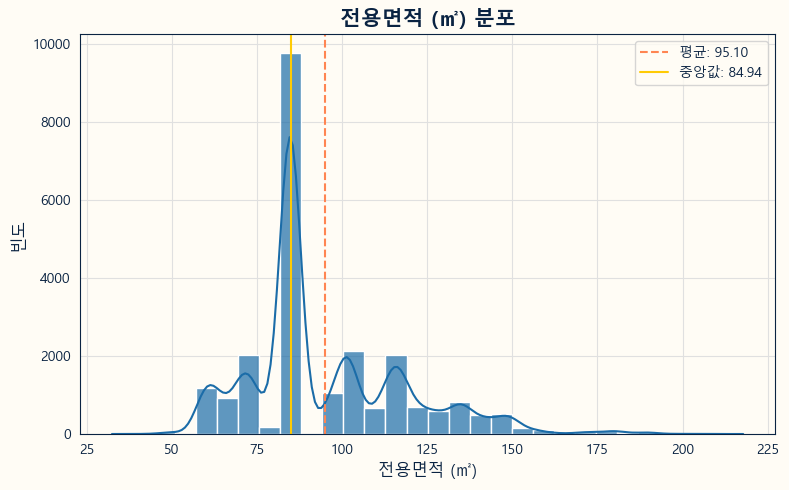

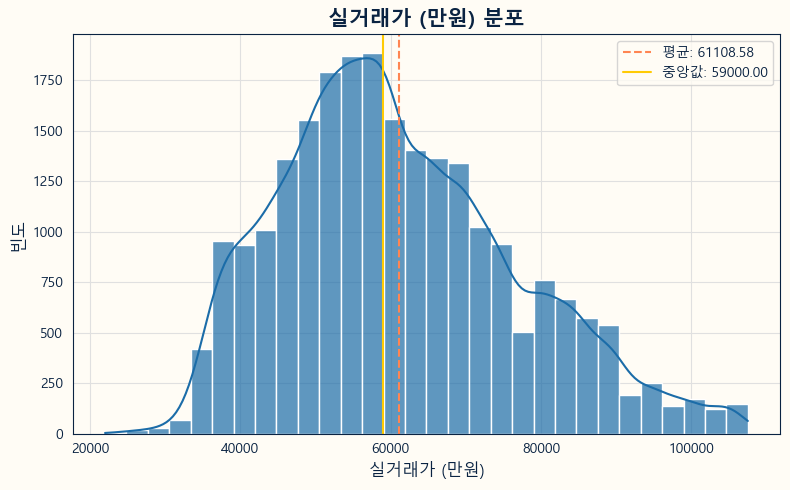

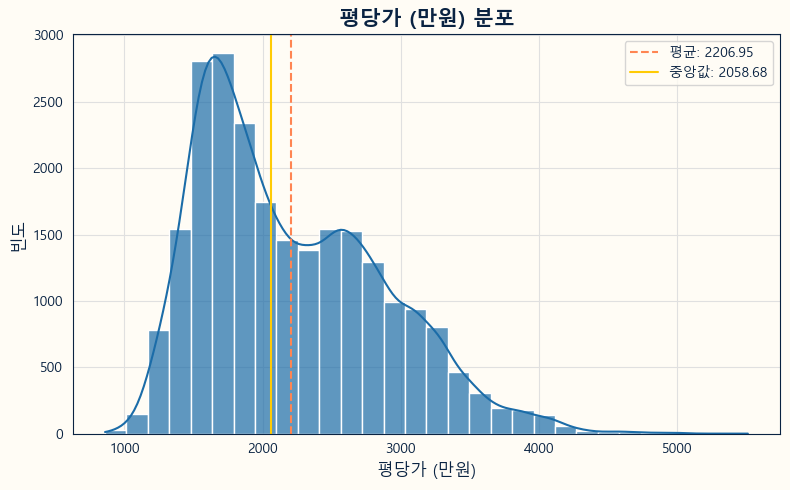

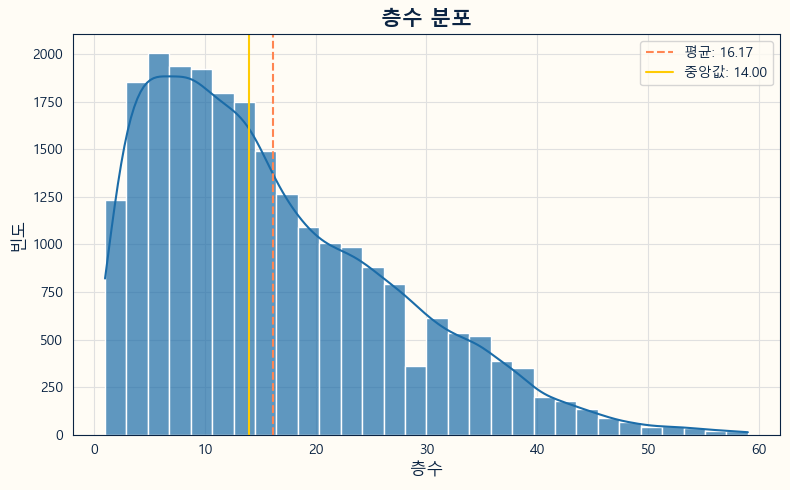

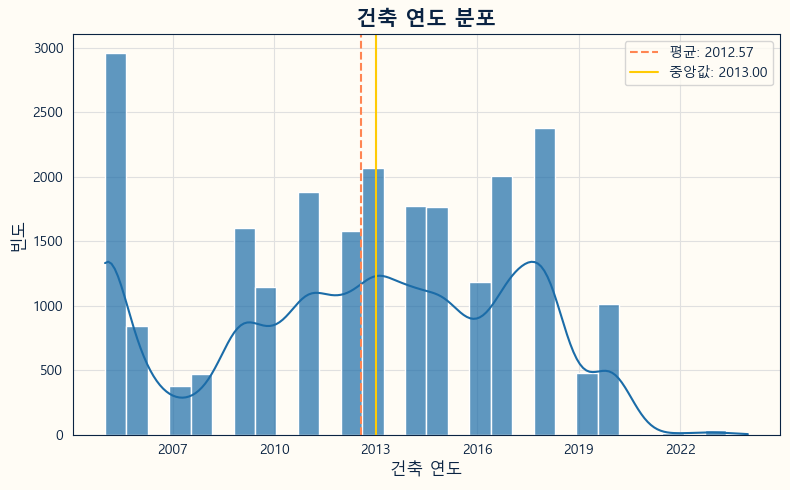

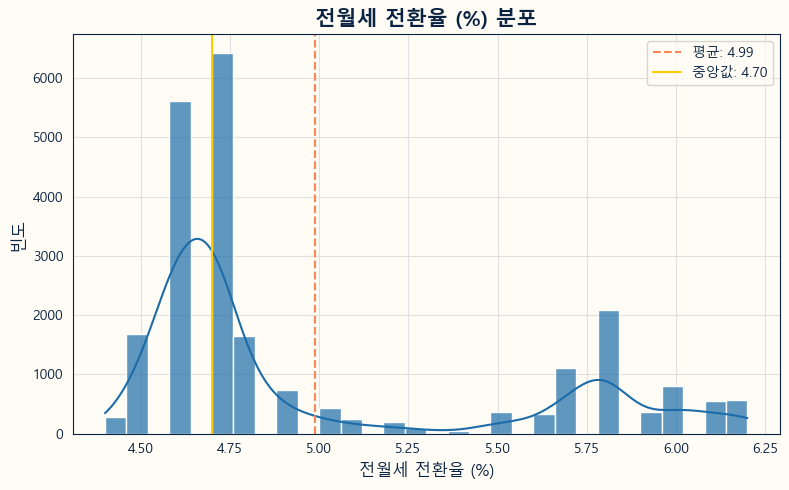

In [ ]:
plot_variable_distribution(apt_df, 'excluUseAr', '전용면적 (㎡)', highlight='both')
plot_variable_distribution(apt_df, 'dealAmount', '실거래가 (만원)', highlight='both')
plot_variable_distribution(apt_df, 'pricePerpy', '평당가 (만원)', highlight='both')
plot_variable_distribution(apt_df, 'floor', '층수', highlight='both')
plot_variable_distribution(apt_df, 'buildYear', '건축 연도', highlight=True, integer_xticks=True)
plot_variable_distribution(apt_df, 'rent_conversion_rate', '전월세 전환율 (%)', highlight='both')

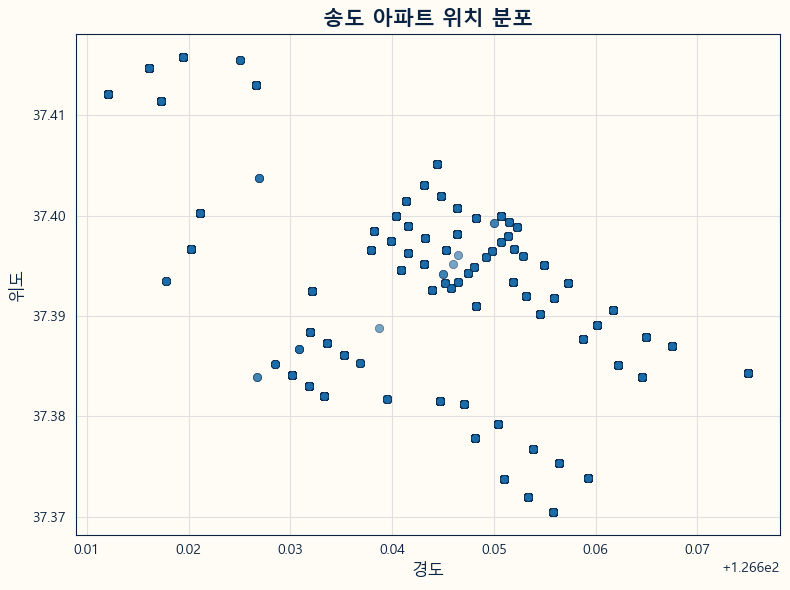

In [ ]:
apply_navistyle()  # 항해사 스타일 적용

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=apt_df, 
    x='longitude', y='latitude',
    alpha=0.6,
    color=navipalette["ocean_blue"],
    edgecolor=navipalette["deep_navy"]
)
plt.title("송도 아파트 위치 분포", fontsize=15, weight='bold')
plt.xlabel("경도")
plt.ylabel("위도")
plt.tight_layout()
plt.show()


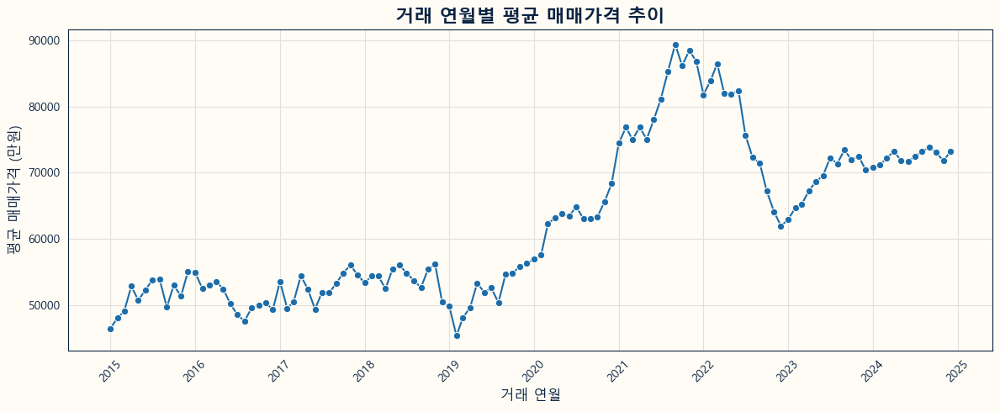

In [ ]:
# 전처리: 연월 컬럼이 datetime 타입인지 확인
apt_df['year_month'] = pd.to_datetime(apt_df['dealDate']).dt.to_period('M').dt.to_timestamp()

# 월별 평균 가격 집계
monthly_price = apt_df.groupby('year_month')['dealAmount'].mean().reset_index()

# 항해사 스타일 적용
apply_navistyle()

# 시각화
plt.figure(figsize=(12, 5))
sns.lineplot(data=monthly_price, x='year_month', y='dealAmount', color=navipalette["ocean_blue"], marker='o')
plt.title("거래 연월별 평균 매매가격 추이", fontsize=16, weight='bold')
plt.xlabel("거래 연월")
plt.ylabel("평균 매매가격 (만원)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### 히스토그램 & KDE 시각화 (로그 변환 후)

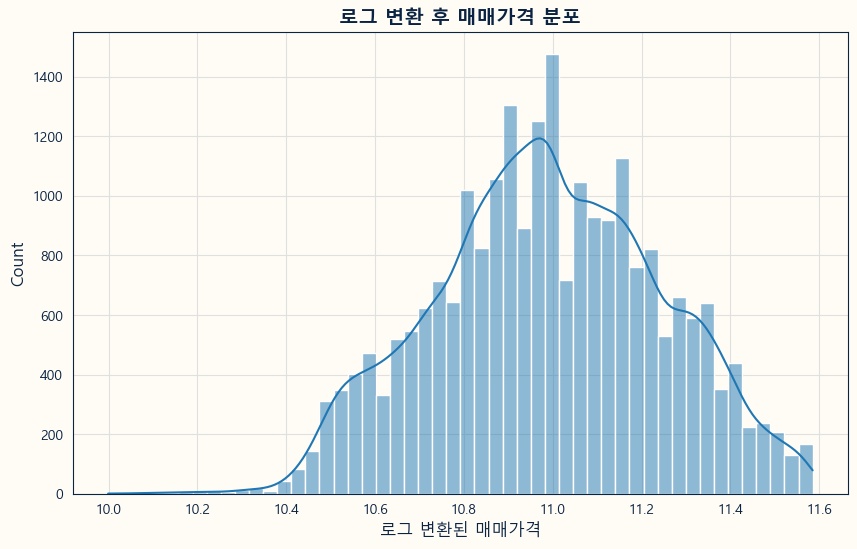

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(apt_df['log_dealAmount'], bins=50, kde=True)
plt.xlabel('로그 변환된 매매가격')
plt.title('로그 변환 후 매매가격 분포')
plt.show()


### 상관관계 히트맵 (숫자형 변수)

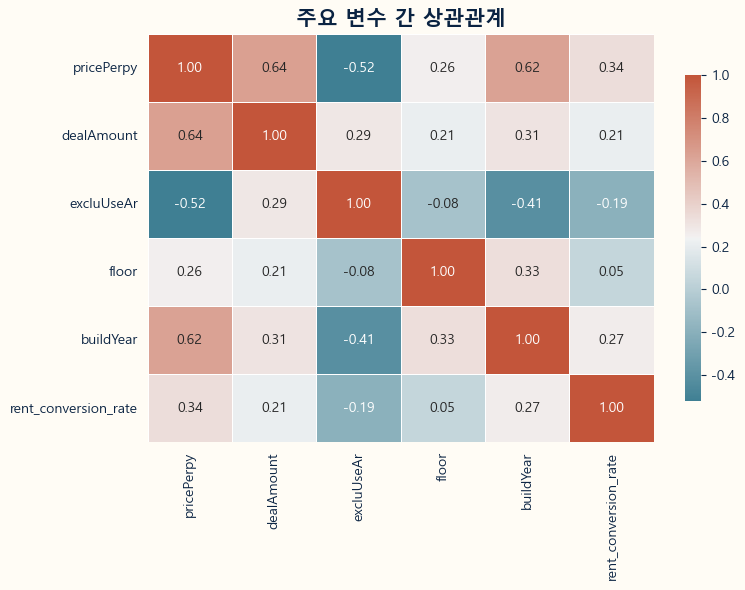

In [ ]:
# 수치형 변수 상관관계 히트맵
numeric_cols = ['pricePerpy', 'dealAmount', 'excluUseAr', 'floor', 'buildYear', 'rent_conversion_rate']
corr_matrix = apt_df[numeric_cols].corr()

apply_navistyle()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True), fmt=".2f", linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title("주요 변수 간 상관관계", fontsize=15, weight='bold')
plt.tight_layout()
plt.show()


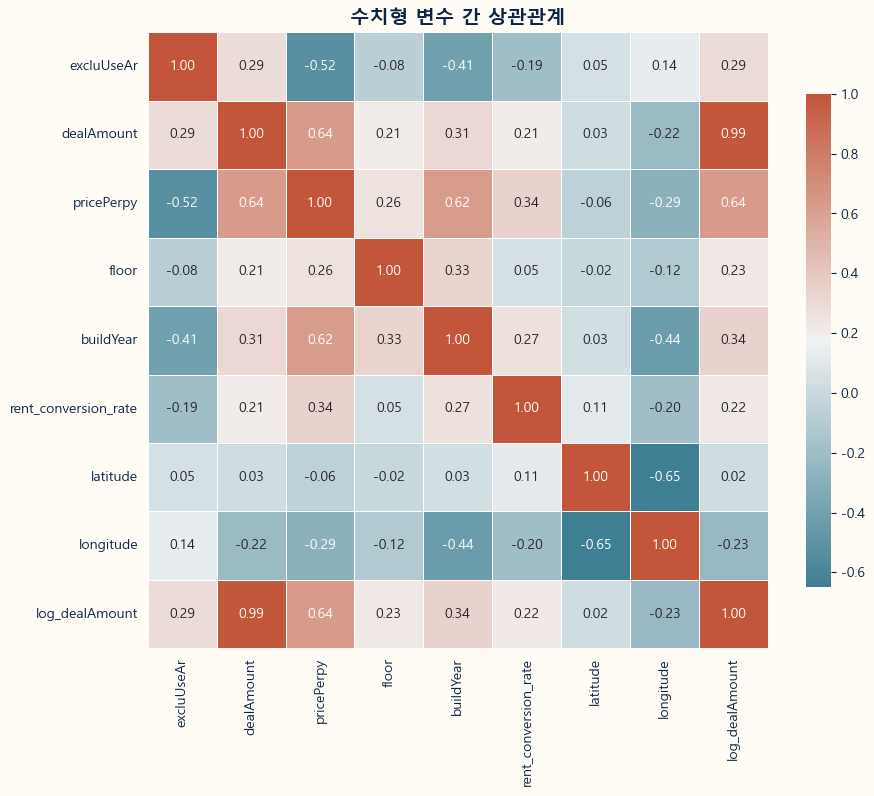

In [ ]:
numeric_columns = apt_df.select_dtypes(include=['float64', 'int64']).columns
corr_matrix = apt_df[numeric_columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap=sns.diverging_palette(220, 20, as_cmap=True),  # coolwarm 대신 세련된 팔레트
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)
plt.title("수치형 변수 간 상관관계", fontweight = 'bold')
plt.show()

### 상관관계 히트맵 해석

#### 매매가격(`dealAmount`)과의 상관관계

- **`excluUseAr` (전용면적) : 0.33**  
  → 전용면적이 클수록 매매가격이 높아지는 경향을 보임  
- **`pricePerpy` (평당가격) : 0.65**  
  → 평당가격이 높을수록 매매가격도 높은 편이며, 전용면적·건축년도 등에 비해 상대적으로 큰 양의 상관  
- **`buildYear` (건축년도) : 0.27**  
  → 건축연도가 최근일수록(=신축일수록) 매매가격이 상승하는 경향  
- **`floor` (층) : 0.21**  
  → 층이 높아질수록 매매가격이 상승하는 경향이 있으나, 전용면적·평당가격만큼의 영향력은 아님  
- **`rent_conversion_rate` (전월세전환율) : 0.20**  
  → 전월세전환율이 높아지면 매매가격이 다소 낮아지는 패턴을 시사 (전세가율이 높은 곳은 상대적으로 매매가가 낮을 수 있음)  
- **`latitude`, `longitude` : 각각 0.03, -0.22**  
  → 송도 내에서 위치에 따라 가격이 달라질 가능성을 보여줌. 특정 좌표(해안가, 중심상권 등)에 따라 고가/저가 지역이 구분될 수 있음  

#### 독립 변수 간의 상관관계

- **`excluUseAr` vs. `pricePerpy`: -0.47**  
  → 넓은 평형(전용면적이 큰 경우)은 평당가격이 상대적으로 낮아지는 경향 (대형 평형은 전체 매매가가 비싸지만, 평당가격은 낮음)  
- **`buildYear` vs. `pricePerpy`: 0.61**  
  → 신축 아파트일수록 평당가격이 높아지는 경향이 뚜렷  
- **`year_month` vs. `pricePerpy`: 0.69**  
  → 최근 거래(연월이 최근일수록)일수록 평당가격이 상승했을 가능성을 시사  
- **그 외**: `latitude`와 `longitude`는 서로 음의 상관(-0.64)을 보이며, 이는 송도 지역 위경도 특성상 특정 방향으로 갈수록 하나는 증가하고 다른 하나는 감소하는 지리적 패턴을 반영함  

---

### 매매가격 분포 (히스토그램)

- **분포 형태:**  
  - 오른쪽으로 긴 꼬리를 가진 우측 편향 분포이며, 4~6억 원(가정) 구간에 거래가 가장 많이 몰려 있음  
  - 10억 원 이상 구간도 소수지만 존재해, 극단적으로 높은 가격대가 분포의 꼬리를 형성  

- **로그 변환 필요성:**  
  - 일부 초고가 거래로 인해 평균과 분산이 크게 왜곡될 수 있음  
  - 로그 변환 시 정규성(가우시안)에 가까운 형태를 얻어 **통계분석·회귀모델**에 유리해질 가능성이 큼  

- **이상치 처리:**  
  - IQR 또는 다른 방식으로 극단값을 제거할지, **시장 내 고가 매물**로 간주해 유지할지는 **분석 목적**에 따라 결정  
  - 일반적인 가격 변동 연구가 목적이라면 초고가를 제거할 수도 있고, 고급 단지 시장 분석이 필요하다면 유지하는 편이 좋음  

---

### 주요 변수 vs. 매매가격 (산점도)

1. **전용면적(`excluUseAr`) vs. 매매가격**  
   - 전반적으로 전용면적이 증가함에 따라 매매가격이 증가하는 추세  
   - 큰 평형대(예: 40평 이상)에서도 가격대가 다양하게 분포 → **단지 브랜드, 입지 차이**에 따른 변동 가능성  

2. **층(`floor`) vs. 매매가격**  
   - 층이 높을수록 매매가격이 상승하는 경향이 있으나, 분포가 넓어 절대적 지표는 아님  
   - 같은 단지 내에서도 고층 프리미엄이 있을 수 있으나, 단지별로 그 효과 차이가 존재  

3. **건축년도(`buildYear`) vs. 매매가격**  
   - 신축일수록 매매가격이 높은 편  
   - 송도 개발 시점(2000년대 중반 이후)부터 최근 건축된 단지들이 **상대적으로 높은 매매가** 형성  

4. **전용면적(`excluUseAr`) vs. 평당가격(`pricePerpy`)**  
   - 소형 평형은 절대 가격은 낮지만 평당가격이 높은 반면, 대형 평형은 절대 매매가는 높아도 평당가격은 낮아지는 패턴  
   - **평형대에 따른 가격대**를 구분해볼 필요 있음  

5. **전월세전환율(`rent_conversion_rate`) vs. 매매가격**  
   - 전월세전환율이 높으면 상대적으로 매매가격이 낮은 경향  
   - 전세가율이 높은 곳(또는 전월세전환율이 높은 곳)은 입지·브랜드가 다소 낮은 곳일 수도 있음  

---

### 추가로 살펴볼 점

- **위치 정보(위도·경도) 세분화 분석**  
  - 상관계수만으로는 지역별 시세 차이를 구체적으로 파악하기 어려우므로, **지도 시각화** 또는 **클러스터링**을 통해 입지별 시세 격차를 확인  
- **로그 변환 후 상관관계 재확인**  
  - `dealAmount`를 로그 변환하면, 왜도가 줄어들어 다른 변수와의 상관계수가 달라질 수 있음  
  - 모델링(회귀, 트리 모델 등) 적용 전후로 비교하며 **성능 개선** 여부를 평가  
- **브랜드·공구(1~11공구) 등 범주형 변수 고려**  
  - 송도는 특정 브랜드(예: 더샵, 힐스테이트 등)나 공구별로 시세 차이가 크므로, 이들 변수를 추가 분석하면 **더 정교한 인사이트** 가능  

---

### 요약

- **전용면적, 평당가격, 건축년도**가 매매가격과 뚜렷한 양의 상관관계를 보이며, 전월세전환율은 음의 경향  
- 매매가격은 우측 꼬리가 긴 분포로, 초고가 거래가 일부 존재  
- 전용면적이 커질수록 절대 매매가격은 높아지지만, 평당가격은 낮아지는 경향  
- 위치(위경도)·브랜드·공구 등 추가 요인을 고려하면 **더 정밀한 시세 분석** 가능  

### VIF 계산 및 OLS 회귀

In [ ]:
# 3.3 VIF 계산 및 OLS 회귀
features = ['excluUseAr', 'pricePerpy', 'buildYear', 'floor', 'rent_conversion_rate']
X = apt_df[features]
X = sm.add_constant(X)
y = apt_df['dealAmount']

def calculate_vif(exog):
    vif_df = pd.DataFrame()
    vif_df['feature'] = exog.columns
    vif_df['VIF'] = [variance_inflation_factor(exog.values, i) for i in range(exog.shape[1])]
    return vif_df

vif_result = calculate_vif(X)
print("VIF 결과:")
print(vif_result)

model = sm.OLS(y, X).fit()
print(model.summary())


# 규제 회귀(Ridge)를 통한 다중공선성 완화 예제
# Ridge 모델은 독립 변수 간 상관성이 높을 경우 계수를 안정화시켜줌.
# 먼저, 상수항을 제외하고 표준화 진행
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X.drop(columns='const'))

# RidgeCV: 교차 검증을 통해 최적의 alpha(규제 강도)를 선택
alphas = np.logspace(-6, 6, 13)
ridge_model = RidgeCV(alphas=alphas, cv=5).fit(X_scaled, y)
print("Ridge Regression 최적 alpha:", ridge_model.alpha_)
print("Ridge Regression 계수:")
ridge_coef = pd.Series(ridge_model.coef_, index=X.drop(columns='const').columns)
print(ridge_coef)

VIF 결과:
                feature            VIF
0                 const  349637.939193
1            excluUseAr       1.414629
2            pricePerpy       1.999810
3             buildYear       1.770402
4                 floor       1.145311
5  rent_conversion_rate       1.139772
                            OLS Regression Results                            
Dep. Variable:             dealAmount   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                 6.374e+04
Date:                Mon, 31 Mar 2025   Prob (F-statistic):               0.00
Time:                        22:02:34   Log-Likelihood:            -2.2970e+05
No. Observations:               23585   AIC:                         4.594e+05
Df Residuals:                   23579   BIC:                         4.595e+05
Df Model:                           5                                         
Covarian

VIF 결과:
                feature            VIF
0                 const  349637.939193
1            excluUseAr       1.414629
2            pricePerpy       1.999810
3             buildYear       1.770402
4                 floor       1.145311
5  rent_conversion_rate       1.139772


C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_18472\1862934308.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=vif_result[1:], x="VIF", y="feature", palette=[navipalette["ocean_blue"]]*len(vif_result[1:]))


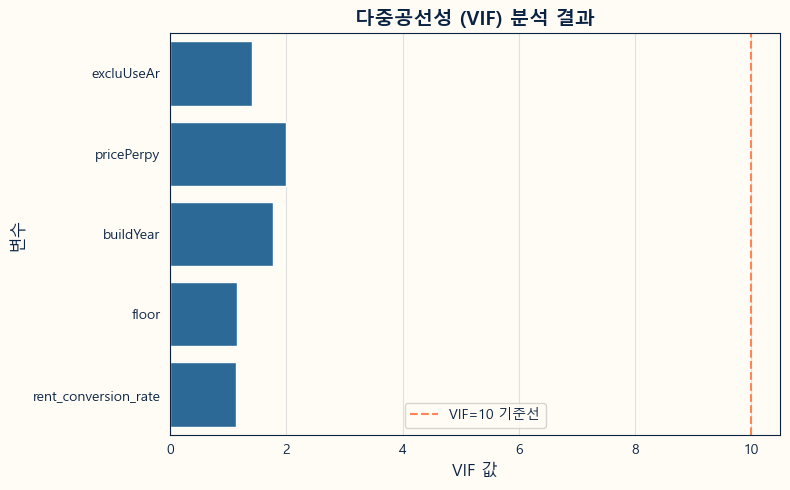

In [ ]:
# 1. VIF 계산 결과 시각화
apply_navistyle()

vif_result = calculate_vif(X)
print("VIF 결과:")
print(vif_result)

plt.figure(figsize=(8, 5))
sns.barplot(data=vif_result[1:], x="VIF", y="feature", palette=[navipalette["ocean_blue"]]*len(vif_result[1:]))
plt.title("다중공선성 (VIF) 분석 결과", fontsize=14, weight='bold')
plt.xlabel("VIF 값")
plt.ylabel("변수")
plt.axvline(x=10, color=navipalette["sunset_orange"], linestyle='--', label="VIF=10 기준선")
plt.legend()
plt.tight_layout()
plt.show()


Ridge Regression 최적 alpha: 100.0
Ridge Regression 계수:
excluUseAr              13140.373671
pricePerpy              16840.818773
buildYear                -347.140425
floor                     151.733870
rent_conversion_rate      218.015557
dtype: float64


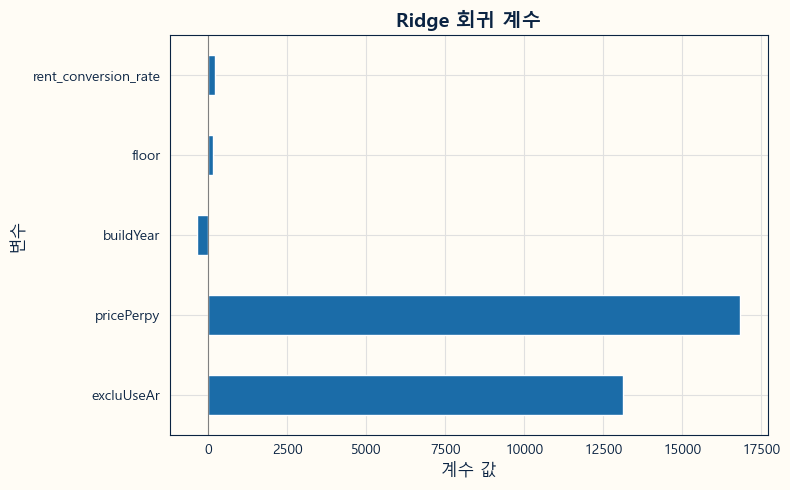

In [ ]:
# 2. Ridge 회귀 결과 시각화
ridge_model = RidgeCV(alphas=alphas, cv=5).fit(X_scaled, y)
print("Ridge Regression 최적 alpha:", ridge_model.alpha_)

ridge_coef = pd.Series(ridge_model.coef_, index=X.drop(columns='const').columns)
print("Ridge Regression 계수:")
print(ridge_coef)

plt.figure(figsize=(8, 5))
ridge_coef.plot(kind='barh', color=navipalette["ocean_blue"])
plt.title("Ridge 회귀 계수", fontsize=14, weight='bold')
plt.axvline(x=0, color='gray', linewidth=0.8)
plt.xlabel("계수 값")
plt.ylabel("변수")
plt.tight_layout()
plt.show()


- VIF 기준선 10: 일반적으로 10 이상이면 다중공선성이 높다고 판단
- Ridge 계수: 일반 OLS보다 계수가 작아지며, 과도한 가중치를 줄이는 역할
- 시각화는 항해사 팔레트와 어울리게 구성됨 (deep_navy, ocean_blue 등 활용)

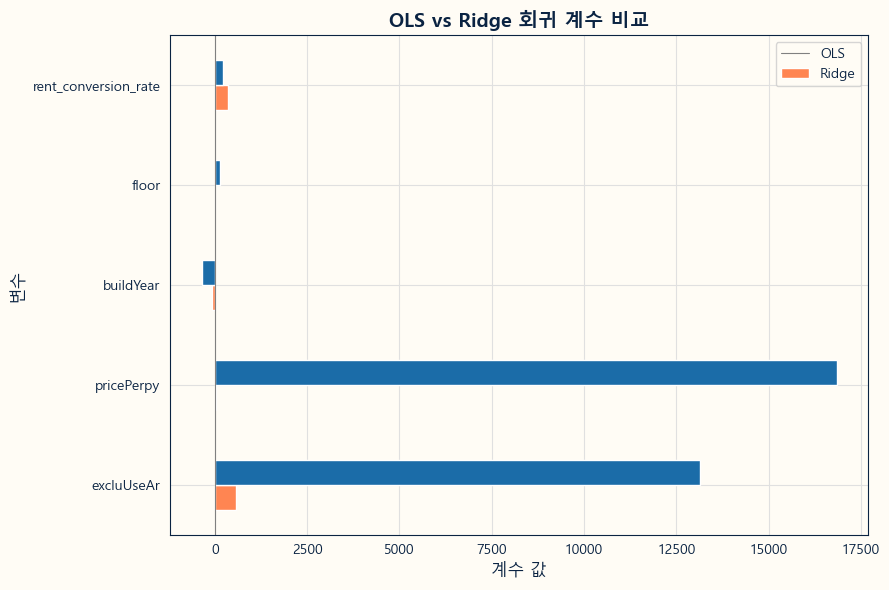

In [ ]:
# OLS 회귀 계수 추출 (const 제외)
ols_coef = pd.Series(model.params.drop('const'), name='OLS')

# Ridge 계수 (이미 있음)
ridge_coef.name = 'Ridge'

# 두 계수 DataFrame으로 병합
coef_df = pd.concat([ols_coef, ridge_coef], axis=1)

# 시각화
apply_navistyle()
coef_df.plot(kind='barh', figsize=(9, 6),
             color=[navipalette["sunset_orange"], navipalette["ocean_blue"]])

plt.title("OLS vs Ridge 회귀 계수 비교", fontsize=14, weight='bold')
plt.axvline(x=0, color='gray', linewidth=0.8)
plt.xlabel("계수 값")
plt.ylabel("변수")
plt.legend(["OLS", "Ridge"])
plt.tight_layout()
plt.show()

- OLS는 특정 변수에 과도하게 큰 계수를 부여하는 경향이 있음
- Ridge는 이를 완화하고, 모든 변수를 좀 더 균형 있게 반영
- 특히 다중공선성(서로 유사한 정보를 가진 변수들)이 있는 상황에서 효과적
- 위 그래프에서 계수가 줄어든 변수를 주목하면 Ridge의 특성이 잘 드러남

#### VIF 분석 결과 해석

| feature               | VIF       |
|:----------------------|----------:|
| const                 | 348047.78 |
| excluUseAr            | 1.34      |
| pricePerpy            | 1.86      |
| buildYear             | 1.75      |
| floor                 | 1.14      |
| rent_conversion_rate  | 1.14      |

- **상수항 (const)의 VIF:**  
  - 상수항의 VIF가 매우 크게 나타나는 것은 일반적인 현상입니다.  
  - 회귀분석에서 상수항은 다중공선성 진단 시 중요하게 고려하지 않으므로 이 값은 크게 신경 쓸 필요가 없습니다.

- **나머지 변수의 VIF:**  
  - `excluUseAr`, `pricePerpy`, `buildYear`, `floor`, `rent_conversion_rate`의 VIF 값이 모두 2 이하입니다.
  - 일반적으로 VIF가 5 이하 또는 10 이하인 경우 다중공선성이 심각하지 않다고 판단하므로, 여기서는 다중공선성 문제가 거의 없다고 볼 수 있습니다.
  - 이는 독립변수들 간에 강한 상관관계가 존재하지 않으므로 회귀계수 추정이 안정적으로 이루어질 수 있음을 시사합니다.

---

#### OLS 회귀 결과 해석

1. **모형 적합도 (R-squared = 0.935):**  
   - 결정계수(R²)가 0.935로 매우 높습니다.  
   - 이는 선택된 다섯 개 변수(전용면적, 평당가격, 건축년도, 층, 전월세전환율)가 전체 매매가격 변동의 약 93.5%를 설명한다는 의미입니다.
   - 모델의 설명력이 높으므로, 이 변수들이 매매가격 예측에 큰 영향을 미친다고 해석할 수 있습니다.

2. **주요 변수 해석:**  
   - **`excluUseAr (전용면적): 589.355**  
     - 전용면적이 1m² 증가할 때마다 매매가격이 약 589만 원 상승하는 것으로 추정됩니다.
   - **`pricePerpy (평당가격): 26.741**  
     - 평당가격이 1만 원/평 상승할 때마다 전체 매매가격이 약 26.7만 원 상승한다고 해석됩니다.
     - 단, 실제 단위(예: 만 원/평 또는 원/평)에 따라 해석이 달라질 수 있으므로 단위 확인이 필요합니다.
   - **`buildYear (건축년도): -144.1948**  
     - 건축년도 계수가 음수로 나타났습니다.
     - 이는 보통 신축 아파트가 매매가격이 높을 것이라는 기대와 반대되는 결과로 보이지만,  
       - 실제로 최근 건축된 단지의 경우 전용면적이나 평당가격이 이미 높게 반영되어 회귀식 내에서 상대적으로 음의 효과를 보일 수 있습니다.
       - 또는 `year_month`와 같은 시점 변수와 상호작용하는 효과로 인해 나타날 수도 있습니다.
   - **`floor (층): 12.4955**  
     - 층이 1층 증가할 때마다 매매가격이 약 12.5만 원 상승하는 것으로 추정되지만, 다른 변수에 비해 영향력은 크지 않습니다.
   - **`rent_conversion_rate (전월세전환율): 337.9211**  
     - 전월세전환율이 1% 포인트 증가할 때 매매가격이 약 338만 원 상승하는 결과가 나왔습니다.
     - 일반적으로 전세가율이 높으면 매매가격이 낮아질 가능성을 기대할 수도 있으나,  
       여기서는 양의 계수가 나온 이유는 다른 변수와의 상호작용이나 특정 지역적 특성 때문일 수 있으므로, 추가적인 해석이 필요합니다.

3. **조건수 (Condition Number)가 큰 이유:**  
   - 조건수가 약 1,800,000으로 매우 큰데, 이는 변수들 간의 스케일 차이가 크게 작용했기 때문입니다.
   - 예를 들어, 건축년도는 2000 이상의 큰 값, 전용면적은 대략 100 근방, 평당가격은 상대적으로 작은 값 등 서로 다른 크기를 갖기 때문에 조건수가 커질 수 있습니다.
   - 다행히 VIF 값은 낮으므로 다중공선성 문제보다는 단순한 수치 스케일 문제로 해석할 수 있으며, 스케일 조정(표준화, 로그 변환 등)을 적용하면 조건수를 낮출 수 있습니다.

---

#### 종합 결론

- **다중공선성 문제:**  
  - 상수항을 제외한 주요 변수들의 VIF가 2 이하로 나타나, 다중공선성이 거의 없는 안정적인 상태임을 확인할 수 있습니다.

- **모형의 설명력:**  
  - R² 값이 93.5%로 매우 높아, 모델에 포함된 다섯 개 변수가 아파트 매매가격의 대부분을 설명하고 있다는 점에서 매우 높은 설명력을 가진다고 볼 수 있습니다.

- **개별 변수 해석:**  
  - 전용면적과 평당가격는 매매가격에 대해 양의 효과를 가지며, 건축년도는 예상과 달리 음의 효과를 보이는데 이는 데이터의 특성이나 다른 변수와의 상호작용 때문일 수 있습니다.
  - 층과 전월세전환율도 양의 효과를 보이나, 상대적인 영향력은 전용면적과 평당가격에 비해 작거나 해석에 주의가 필요합니다.

- **스케일 문제:**  
  - 조건수가 크다는 점은 변수 간 단위 차이가 크다는 것을 의미하며, 표준화나 로그 변환 등으로 스케일 조정을 고려할 수 있습니다.

이러한 해석을 바탕으로, 모델은 전체적으로 안정적인 추정이 가능하며, 추가적으로 스케일 조정을 통해 수치적 안정성을 보완하는 방안을 고려할 수 있습니다.

## 2) 시계열 분석

### 변수 및 데이터 정렬

In [ ]:
apt_df['dealDate'] = pd.to_datetime(apt_df['dealDate'])
apt_df['year'] = apt_df['dealDate'].dt.year
apt_df['year_month'] = apt_df['dealDate'].dt.to_period('M').astype(str)
apt_df['year_month'] = pd.to_datetime(apt_df['year_month'])
apt_df = apt_df.sort_values('dealDate')

### 연도별,월별 평균 매매가격 및 거래 건수

In [ ]:
yearly_summary = apt_df.groupby('year').agg({
    'dealAmount': 'mean',
    'aptNm': 'count'
}).reset_index().rename(columns={'dealAmount': 'avg_price', 'aptNm': 'transaction_count'})

monthly_summary = apt_df.groupby('year_month').agg({
    'dealAmount': 'mean',
    'aptNm': 'count'
}).reset_index().rename(columns={'dealAmount': 'avg_price', 'aptNm': 'transaction_count'})


### 연도별 시계열 시각화

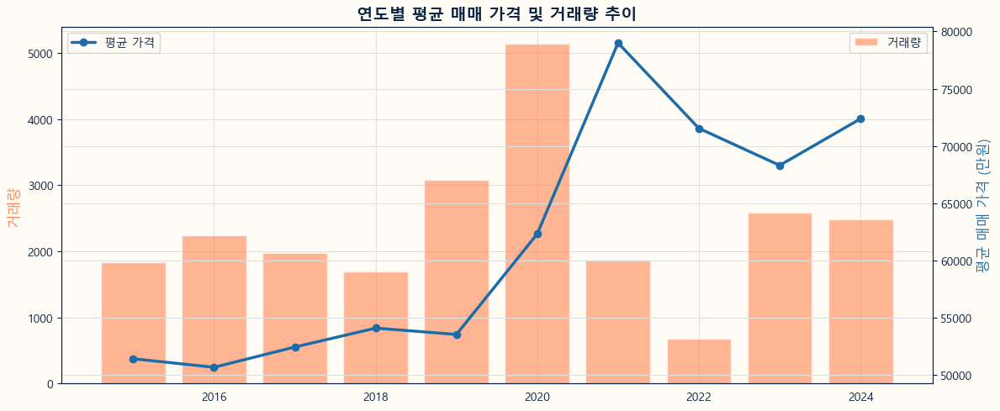

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 5))
ax2 = ax1.twinx()

# 평균 가격 선 (파란색)
ax2.plot(
    yearly_summary['year'],
    yearly_summary['avg_price'],
    marker='o',
    linestyle='-',
    color=navipalette["ocean_blue"],
    linewidth=2.5,
    markersize=6,
    label='평균 가격',
    zorder=9
)

# 거래량 막대 (주황색)
ax1.bar(
    yearly_summary['year'],
    yearly_summary['transaction_count'],
    alpha=0.6,
    color=navipalette["sunset_orange"],
    label='거래량',
    zorder=1
)

# 축 및 제목 설정
ax2.set_xlabel('연도')
ax2.set_ylabel('평균 매매 가격 (만원)', color=navipalette["ocean_blue"])
ax1.set_ylabel('거래량', color=navipalette["sunset_orange"])
ax2.set_title('연도별 평균 매매 가격 및 거래량 추이')

# 범례
ax2.legend(loc='upper left')
ax1.legend(loc='upper right')

plt.tight_layout()
plt.show()


### 월별 시계열 시각화

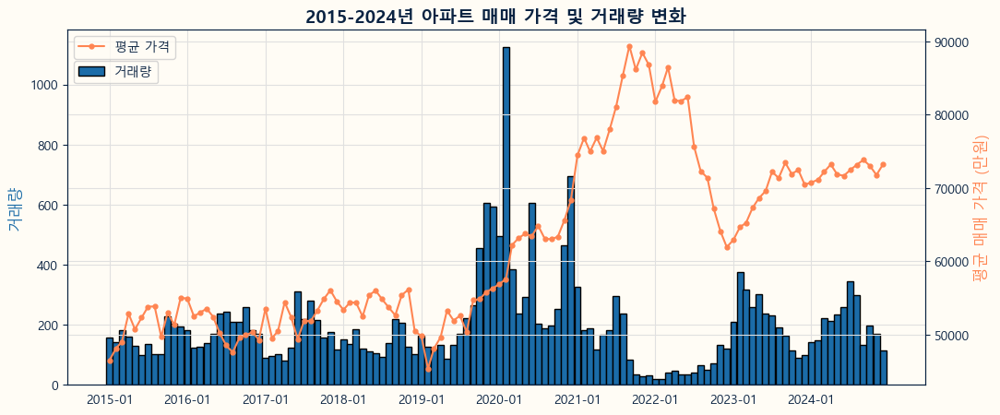

In [ ]:
# 월별 가격 및 거래량 분석
monthly_summary = apt_df.groupby('year_month').agg({'dealAmount': 'mean', 'aptNm': 'count'}).reset_index()
monthly_summary.rename(columns={'dealAmount': 'avg_price', 'aptNm': 'transaction_count'}, inplace=True)
monthly_summary['year_month'] = monthly_summary['year_month'].astype(str)
monthly_summary['year_month'] = pd.to_datetime(monthly_summary['year_month'])

fig, ax3 = plt.subplots(figsize=(12, 5))
ax4 = ax3.twinx()
ax4.plot(monthly_summary['year_month'], monthly_summary['avg_price'], marker='o', markersize=3.5, linestyle='-', color=navipalette['sunset_orange'], label='평균 가격')
ax3.bar(monthly_summary['year_month'], monthly_summary['transaction_count'], width=30, color=navipalette['ocean_blue'], edgecolor = 'black', label='거래량')
ax4.set_xlabel('연도')
ax4.set_ylabel('평균 매매 가격 (만원)', color=navipalette['sunset_orange'])
ax3.set_ylabel('거래량', color=navipalette['ocean_blue'])
ax4.set_title('2015-2024년 아파트 매매 가격 및 거래량 변화',fontweight = 'bold')
ax4.legend(loc='upper left', bbox_to_anchor=(0, 1))
ax3.legend(loc='upper left', bbox_to_anchor=(0, 0.93))

# X축을 연도별 1월만 표시
tick_labels = monthly_summary[monthly_summary['year_month'].dt.month == 1]['year_month'].dt.strftime('%Y-%m')
plt.xticks(tick_labels, tick_labels, rotation=45, ha='right')
plt.show()

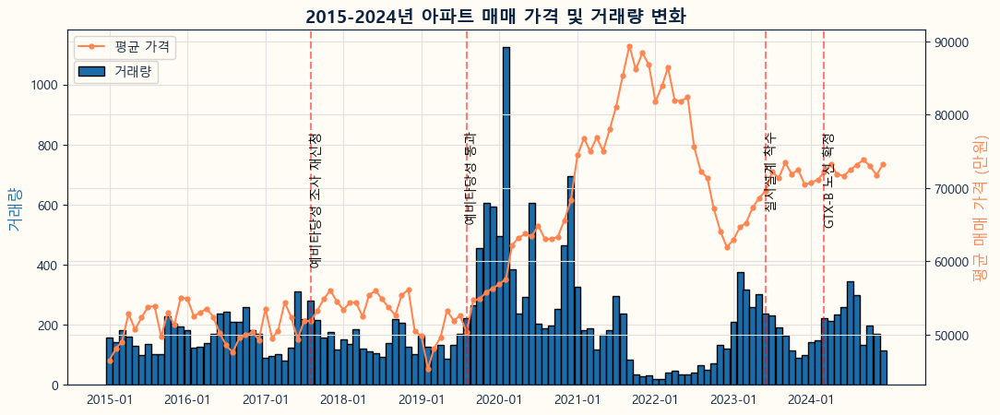

In [ ]:
# 주요 이벤트의 날짜를 datetime 형식으로 변환
major_events = {
    "예비타당성 조사 재신청": pd.to_datetime("2017-08-01"),
    "예비타당성 통과": pd.to_datetime("2019-08-01"),
    "실시설계 착수": pd.to_datetime("2023-06-01"),
    "GTX-B 노선 확정": pd.to_datetime("2024-03-01")
}

# X축을 매년 1월만 표시하고, 거래량 범례를 평균 가격 바로 아래로 조정
fig, ax3 = plt.subplots(figsize=(12, 5))
ax4 = ax3.twinx()
ax4.plot(monthly_summary['year_month'], monthly_summary['avg_price'], marker='o', markersize=3.5, linestyle='-', color=navipalette['sunset_orange'], label='평균 가격')
ax3.bar(monthly_summary['year_month'], monthly_summary['transaction_count'], width=30, color=navipalette['ocean_blue'], edgecolor = 'black', label='거래량')
ax4.set_xlabel('연도')
ax4.set_ylabel('평균 매매 가격 (만원)', color=navipalette['sunset_orange'])
ax3.set_ylabel('거래량', color=navipalette['ocean_blue'])
ax4.set_title('2015-2024년 아파트 매매 가격 및 거래량 변화',fontweight = 'bold')
ax4.legend(loc='upper left', bbox_to_anchor=(0, 1))
ax3.legend(loc='upper left', bbox_to_anchor=(0, 0.93))

# 이벤트 표시 (datetime 형식으로 변환된 값 사용)
for event, date in major_events.items():
    plt.axvline(x=date, color='red', linestyle='--', alpha=0.5)
    plt.text(date, plt.ylim()[1] * 0.85, event, rotation=90, verticalalignment='top', fontsize=10, color='black')

# X축을 연도별 1월만 표시
tick_labels = monthly_summary[monthly_summary['year_month'].dt.month == 1]['year_month'].dt.strftime('%Y-%m')
plt.xticks(pd.to_datetime(tick_labels), tick_labels, rotation=45, ha='right')
plt.show()

### 시계열 분해(트렌드, 계절성, 불규칙성)

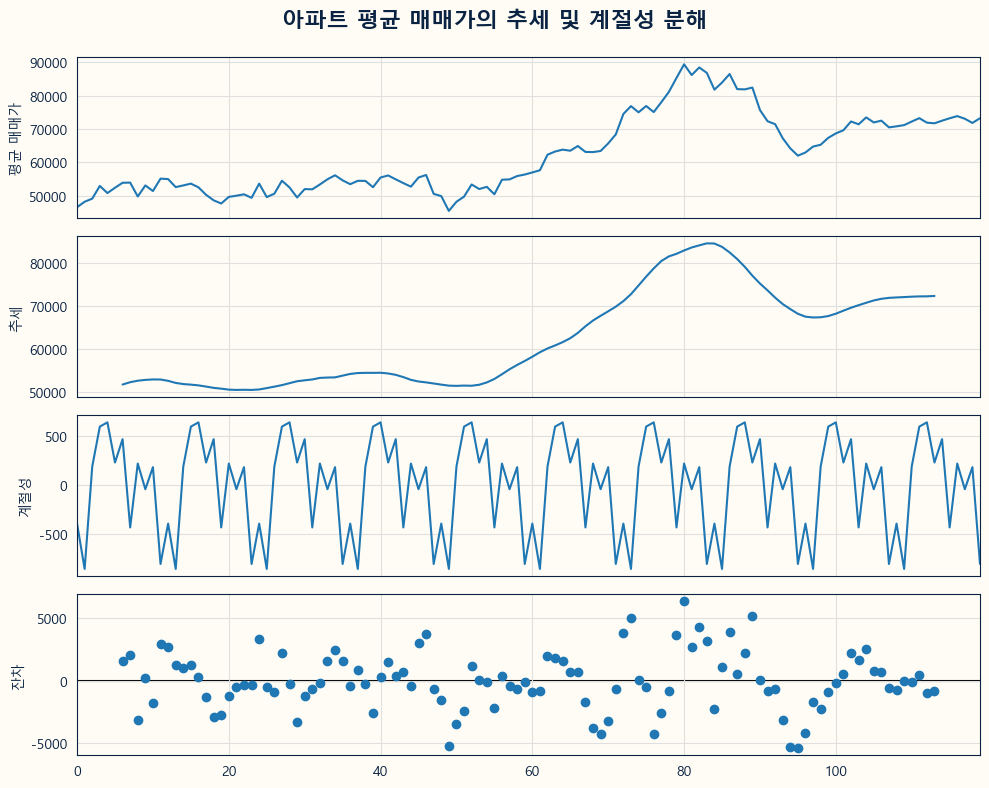

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# 계절 분해
result = seasonal_decompose(monthly_summary['avg_price'], model='additive', period=12)

# 플롯
fig = result.plot()
fig.set_size_inches(10, 8)  # 그래프 크기 조정 (선택)
plt.suptitle("아파트 평균 매매가의 추세 및 계절성 분해", fontsize=16, fontweight='bold')  # ✅ 제목 추가
fig.axes[0].set_ylabel("평균 매매가", fontsize=10)
fig.axes[1].set_ylabel("추세", fontsize=10)
fig.axes[2].set_ylabel("계절성", fontsize=10)
fig.axes[3].set_ylabel("잔차", fontsize=10)
fig.axes[0].set_title("")
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # 제목이 겹치지 않게 조정
plt.show()


### 이동평균 적용

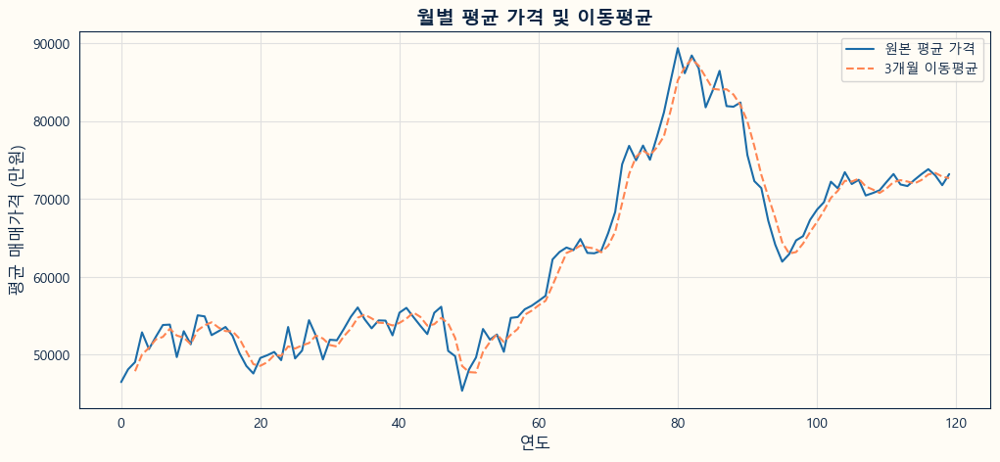

In [ ]:
monthly_summary['MA_3'] = monthly_summary['avg_price'].rolling(window=3).mean()  # 3개월 이동평균
plt.figure(figsize=(12, 5))
plt.plot(monthly_summary.index, monthly_summary['avg_price'], label='원본 평균 가격',color=navipalette['ocean_blue'])
plt.plot(monthly_summary.index, monthly_summary['MA_3'], label='3개월 이동평균', linestyle='--',color=navipalette['sunset_orange'])
plt.xlabel('연도')
plt.ylabel('평균 매매가격 (만원)')
plt.title('월별 평균 가격 및 이동평균', fontweight='bold')
plt.legend()
plt.show()

### 산점도

In [ ]:
apt_df.columns

Index(['sdNm', 'sggNm', 'umdNm', 'jibun', 'aptNm', 'excluUseAr', 'dealDate',
       'dealAmount', 'pricePerpy', 'floor', 'buildYear', 'year_month',
       'rent_conversion_rate', 'full_address', 'latitude', 'longitude', 'year',
       'log_dealAmount'],
      dtype='object')

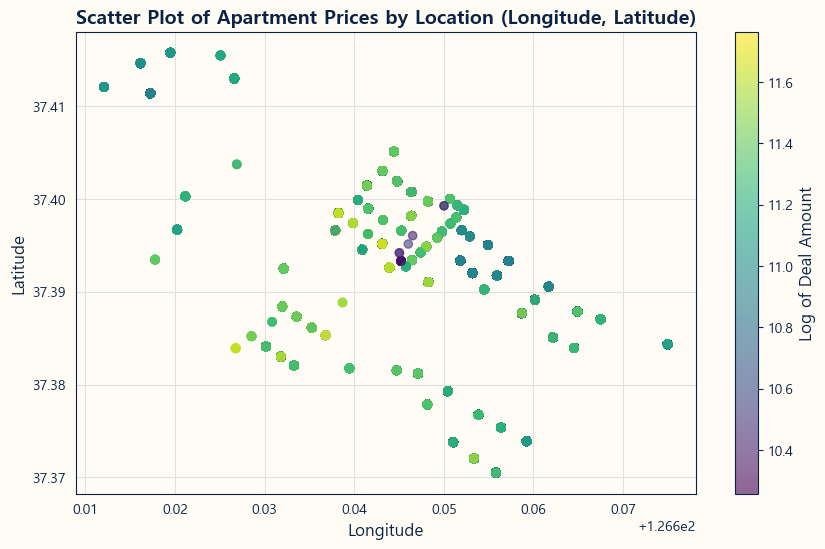

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 데이터 재로드
data = pd.read_csv('rename_final_df.csv')

# 위도, 경도 및 매매가격 산점도 시각화
plt.figure(figsize=(10, 6))
scatter = plt.scatter(data['longitude'], data['latitude'], c=data['log_dealAmount'],
                      cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Log of Deal Amount')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Scatter Plot of Apartment Prices by Location (Longitude, Latitude)')
plt.grid(True)
plt.show()


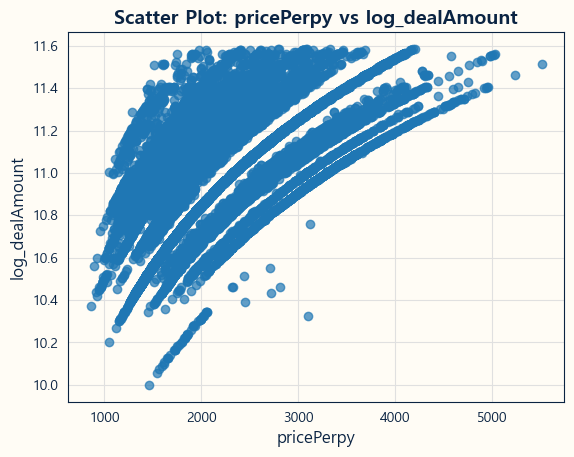

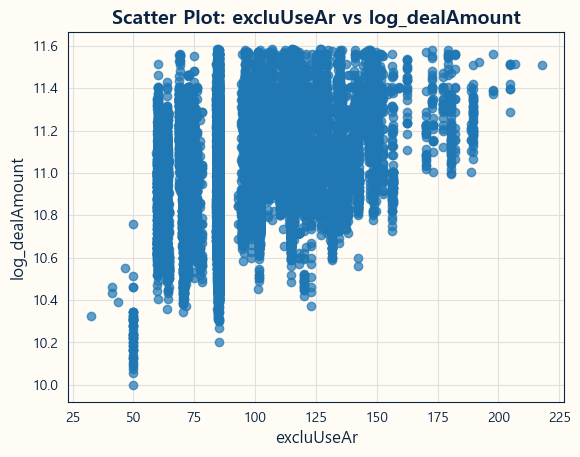

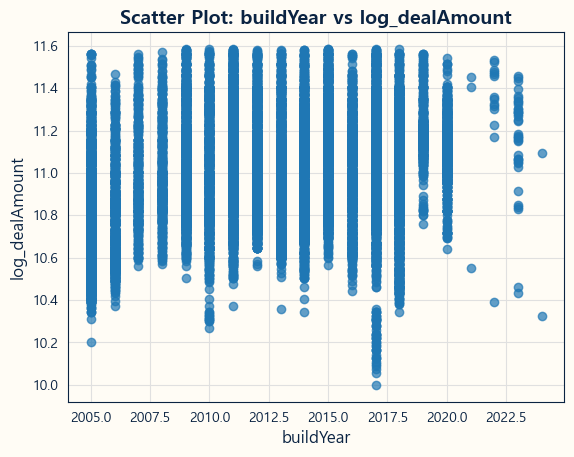

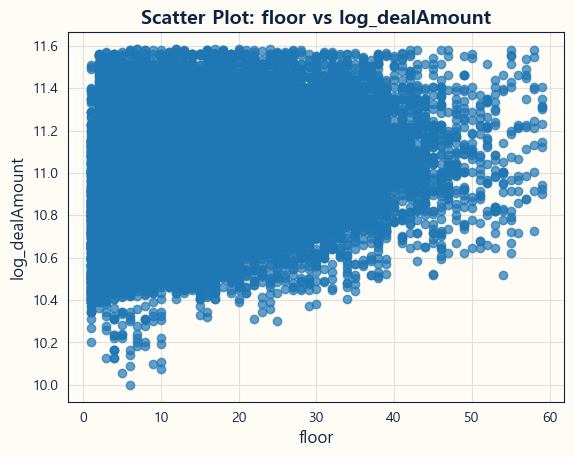

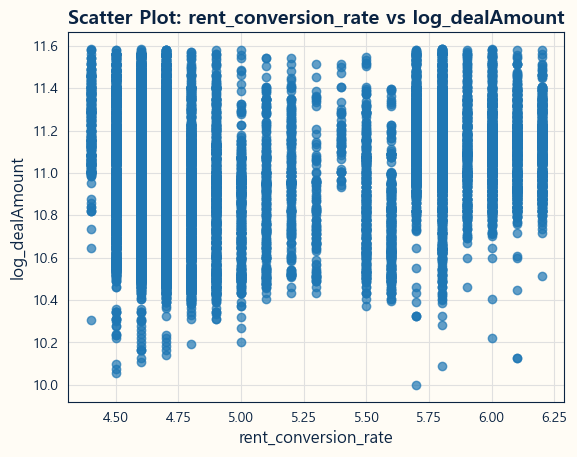

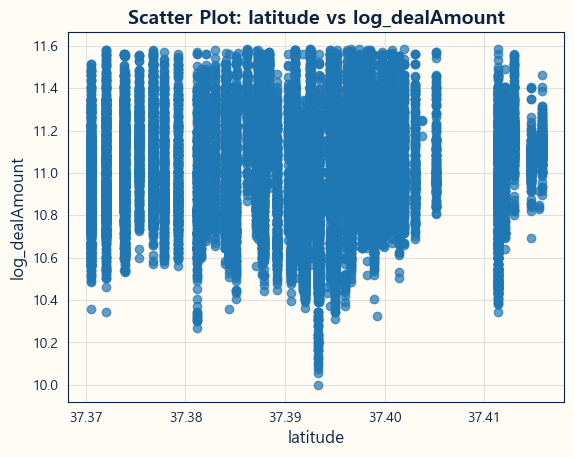

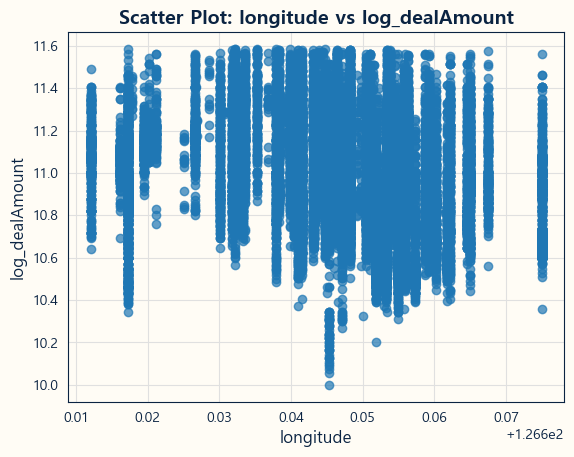

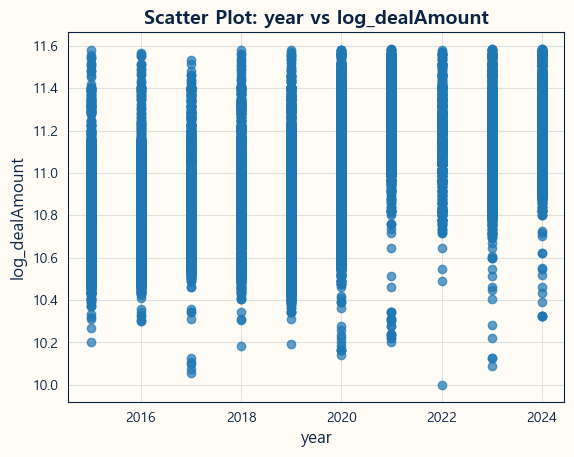

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# 주요 변수와 매매가격의 산점도 각각 별도 플롯으로 생성
variables = ['pricePerpy', 'excluUseAr', 'buildYear', 'floor','rent_conversion_rate','latitude', 'longitude', 'year']

for var in variables:
    plt.figure()
    plt.scatter(apt_df[var], apt_df['log_dealAmount'], alpha=0.7)
    plt.xlabel(var)
    plt.ylabel('log_dealAmount')
    plt.title(f'Scatter Plot: {var} vs log_dealAmount')
    plt.grid(True)
    plt.show()


#### 연도별 평균 매매 가격 및 거래량 추이

1) **2015~2017년:**  
   - 평균 매매가격이 상대적으로 낮은 수준에서 비교적 완만하게 움직임.  
   - 거래량 역시 연평균 3,000~4,000건 정도로 유지되며, 시장이 서서히 활성화되는 모습을 보임.

2) **2018~2019년:**  
   - 평균 매매가격이 소폭 상승하면서 5,000~6,000만 원 선을 유지.  
   - 거래량은 2017년 대비 다소 줄거나 비슷한 수준으로, **완만한 상승 국면**으로 해석됨.

3) **2020~2021년:**  
   - 매매가격이 큰 폭으로 상승하여 8,000만 원 선을 넘어서는 **급등세**가 확인됨.  
   - 특히 2021년 전후로 거래량도 일시적으로 크게 증가해, **거래가 활발해지는 시기**를 시사함.

4) **2022년 이후:**  
   - 2021년 고점 이후 가격이 하락 추세를 보였다가, 2023년 들어 회복세로 전환되어 **완만한 상승**을 이어가는 모습.  
   - 거래량은 2022년 초 급감했다가 2023년 중후반부터 다시 늘어나는 추세로 해석됨.

---

#### 월별 시계열 분석 (2015~2024년)

1) **월별 평균 매매가격 및 거래량 변화**  
   - 2015년부터 약 2019년 초까지는 4,000~5,000만 원 수준에서 **등락을 반복**하면서 완만한 상승 경향.  
   - 2019년 하반기~2020년대 초반에는 가파르게 상승해, 2021년 중반~후반에 **최고점(약 9,000만 원대)** 형성.  
   - 2022년 들어 급락세로 전환, 거래량도 감소. 2023년 이후로는 **거래량과 가격이 서서히 회복**되는 추세.

2) **시계열 분해(Trend, Seasonal, Resid)**  
   - **Trend(추세):** 2020년 전후부터 2021년까지 가파른 상승 후 하락, 2023년 이후 완만한 회복세.  
   - **Seasonal(계절성):** 월별 혹은 분기별로 반복되는 패턴이 존재 (예: 봄 이사철 등)  
   - **Resid(잔차):** 일부 구간에서 큰 변동이 보이지만, 대체로 추세와 계절성을 제거하면 일정 범위 내에서 분포.

3) **이동평균(3개월) vs. 원본 평균 가격**  
   - 3개월 이동평균이 원본 시계열보다 **완만한 곡선**을 형성, 일시적인 급등·급락 구간이 완화되어 **장기 추세 파악**에 유리.  
   - 이동평균도 2021년을 고점으로 하락했다가, 2023년 이후 완만히 상승하는 형태.

---

#### 종합 해석 및 시사점

1. **2015~2019년:**  
   - 상대적으로 낮은 가격대에서 완만한 상승세를 유지, 거래량도 안정적.  
   - 신축 단지 공급과 더불어 입지·인프라가 갖춰지며 **서서히 가격이 오르는 초기 단계**로 볼 수 있음.

2. **2020~2021년 급등:**  
   - 대외적 요인(저금리, 정책 변화 등)과 신도시 개발 기대감이 맞물려 **매매가격이 급격히 상승**.  
   - 거래량도 크게 증가해 시장이 **매우 활황**이었음을 시사.

3. **2022년 조정 및 2023년 이후 회복:**  
   - 2022년부터 금리 인상, 대출 규제 등 영향으로 거래량이 급감하고 가격이 하락.  
   - 2023년 들어 심리적 바닥을 찍고, 다시 거래량이 증가하며 가격도 서서히 회복 추세.

4. **계절성과 장기 추세**  
   - 월별 시계열 분해에서 계절성이 확인되어, 특정 시기에 거래가 몰리고 가격이 변동하는 패턴이 존재함.  
   - 장기 추세(Trend) 측면에서는 2021년 고점 이후 하락을 거쳐 **다시 안정화**되는 흐름.

---

#### 추가 분석 및 활용 방안

- **계절성 모델링**: 월별 혹은 분기별로 매매 수요가 달라지므로, ARIMA나 Prophet 등의 **시계열 예측 모델**에서 계절성을 반영하면 예측 정확도를 높일 수 있음.  
- **금리·정책 변수 연동**: 2020~2021년 급등, 2022년 하락은 거시경제와 정책 변화 영향이 큼. 이 변수들을 추가로 모델에 반영하면 **원인 분석**이 더 정확해질 것임.  
- **공급 물량·인프라 분석**: 특정 시점(예: 2020년~2021년)에 신규 입주 물량 증가, 교통 호재 등이 가격 상승에 영향을 주었을 수 있음.  
- **추가 지역 비교**: 송도 내 세부 구역(공구별), 다른 신도시와 비교하여 상승 패턴이 유사한지, 차이가 있는지 비교하면 **입지 특성**을 더 심층적으로 파악 가능.  

---

#### 결론
- **2015~2019년에는 완만한 상승**, **2020~2021년에는 가파른 상승**, **2022년에는 조정**, **2023년 이후 서서히 회복**이 핵심 흐름.  
- **월별 데이터 분석**을 통해 계절성과 추세를 확인했으며, 이동평균으로 장기 추세를 부드럽게 파악할 수 있음.  
- 향후 **거시경제 요인, 정책, 공급 물량** 등을 함께 고려한 시계열 모델링 및 예측을 통해, **보다 정교한 시장 전망**이 가능할 것으로 보임.

## 3) 예측 모델링 및 평가

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

# 항해사 테마 컬러 팔레트
navipalette = {
    "deep_navy": "#0A2342",
    "ocean_blue": "#1B6CA8",
    "sand_beige": "#D9CBA3",
    "sunset_orange": "#FF8552",  # 강조용
    "star_yellow": "#FFCB05",
    "sail_white": "#FFFCF5"
}

def apply_navistyle():
    """
    항해사 테마 스타일을 matplotlib + seaborn에 적용합니다.
    (폰트: 맑은 고딕, 색상 위주 스타일)
    """
    sns.set_style("whitegrid")
    mpl.rcParams.update({
        'axes.facecolor': navipalette["sail_white"],
        'figure.facecolor': navipalette["sail_white"],
        'axes.edgecolor': navipalette["deep_navy"],
        'axes.labelcolor': navipalette["deep_navy"],
        'xtick.color': navipalette["deep_navy"],
        'ytick.color': navipalette["deep_navy"],
        'text.color': navipalette["deep_navy"],
        'axes.titleweight': 'bold',
        'axes.titlesize': 16,
        'axes.labelsize': 12,
        'grid.color': "#e0e0e0",
        'font.family': 'Malgun Gothic',
        'axes.unicode_minus': False
    })

# 🔹 전용 wrapper 함수 1: lineplot
def navilineplot(x, y, title="", xlabel="", ylabel="", label=None, highlight=False):
    apply_navistyle()
    color = navipalette["sunset_orange"] if highlight else navipalette["ocean_blue"]
    
    plt.plot(x, y, color=color, linewidth=2.5, label=label)
    if label:
        plt.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

# 🔹 전용 wrapper 함수 2: barplot
def navibarplot(x, y, title="", xlabel="", ylabel="", label=None, highlight=False):
    apply_navistyle()
    color = navipalette["sunset_orange"] if highlight else navipalette["ocean_blue"]

    plt.bar(x, y, color=color, label=label)
    if label:
        plt.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

# 🔹 전용 wrapper 함수 3: scatterplot
def naviscatterplot(x, y, title="", xlabel="", ylabel="", label=None, highlight=False):
    apply_navistyle()
    color = navipalette["sunset_orange"] if highlight else navipalette["ocean_blue"]

    plt.scatter(x, y, color=color, s=80, label=label)
    if label:
        plt.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

In [ ]:
df = pd.read_csv('rename_final_df.csv')

In [ ]:
df.dtypes

sdNm                           object
sggNm                          object
umdNm                          object
jibun                          object
aptNm                          object
excluUseAr                    float64
dealDate                       object
dealAmount                    float64
pricePerpy                    float64
floor                           int64
buildYear                       int64
year_month                     object
rent_conversion_rate          float64
full_address                   object
latitude                      float64
longitude                     float64
log_dealAmount                float64
dist_to_nearest_station_m     float64
dist_to_nearest_facility_m    float64
nearby_conveniences             int64
nearby_transports               int64
zone_1                           bool
zone_10                          bool
zone_2                           bool
zone_3                           bool
zone_4                           bool
zone_5      

### 모델 선택 방법

### 타겟 설정
이번 분석의 목표는 아파트 실거래 가격(`dealAmount`)을 예측하는 것입니다.  
그러나 가격 데이터는 고가와 저가 간의 분포 차이가 크기 때문에, **로그 변환(`log_dealAmount`)** 을 통해 이상치 영향을 줄이고 정규성을 확보하였습니다.


### 모델링 접근 방식

- 선형 회귀 기반 모델을 우선 선택한 이유는 다음과 같습니다:
  - **해석 가능성**: 회귀 계수를 통해 변수의 영향력을 이해할 수 있음
  - **성능**: 비교적 단순한 데이터 구조에서는 선형 모델이 효율적
  - **다중공선성**: Ridge, Lasso 등의 정규화 기법을 통해 대응 가능
- 부동산 가격은 다양한 변수의 영향을 받지만, 상당수는 선형적인 경향

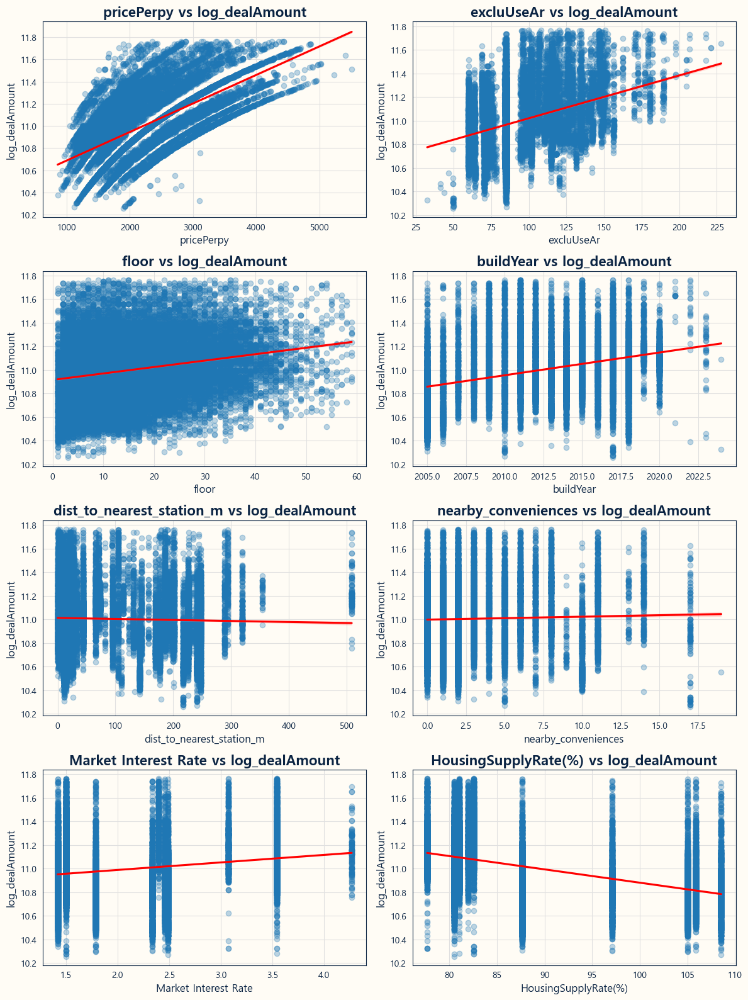

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 주요 수치형 변수 목록
key_features = [
    'pricePerpy', 'excluUseAr', 'floor', 'buildYear',
    'dist_to_nearest_station_m', 'nearby_conveniences',
    'Market Interest Rate', 'HousingSupplyRate(%)'
]

# 타겟값
target = 'log_dealAmount'

# 시각화 스타일 적용 (항해사 테마 적용했다면 호출)
apply_navistyle()

# 각 피처별 산점도 + 회귀선
n_cols = 2
n_rows = (len(key_features) + 1) // n_cols
plt.figure(figsize=(12, n_rows * 4))

for i, feature in enumerate(key_features):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.regplot(data=df, x=feature, y=target,
                scatter_kws={"alpha": 0.3}, line_kws={"color": "red"})
    plt.title(f'{feature} vs {target}')

plt.tight_layout()
plt.show()


## 모델링_1

In [ ]:
# 타겟과 피처 정의
target = 'log_dealAmount'
features = df.columns.drop(['sdNm', 'sggNm', 'umdNm', 'jibun', 'aptNm', 'dealDate', 'year_month',
       'full_address', 'brand','dealAmount', 'log_dealAmount','zone'])

# 결측치 제거
df = df.dropna(subset=[target] + list(features))

# X, y 분리
X = df[features]
y = df[target]

# 학습/검증 세트 분리
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
rmse_lr = np.sqrt(mean_squared_error(y_test, y_pred_lr))
r2_lr = r2_score(y_test, y_pred_lr)

# 2. Ridge Regression (규제 강도 범위 설정)
ridge = RidgeCV(alphas=np.logspace(-4, 4, 50), cv=5)
ridge.fit(X_train, y_train)
y_pred_ridge = ridge.predict(X_test)
rmse_ridge = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
r2_ridge = r2_score(y_test, y_pred_ridge)

# 3. Lasso Regression
lasso = LassoCV(alphas=np.logspace(-4, 0, 50), cv=5, max_iter=10000)
lasso.fit(X_train, y_train)
y_pred_lasso = lasso.predict(X_test)
rmse_lasso = np.sqrt(mean_squared_error(y_test, y_pred_lasso))
r2_lasso = r2_score(y_test, y_pred_lasso)

{
    "Linear Regression": {"RMSE": rmse_lr, "R2": r2_lr},
    "Ridge Regression": {"Alpha": ridge.alpha_, "RMSE": rmse_ridge, "R2": r2_ridge},
    "Lasso Regression": {"Alpha": lasso.alpha_, "RMSE": rmse_lasso, "R2": r2_lasso}
}


{'Linear Regression': {'RMSE': np.float64(0.057340648737953484),
  'R2': 0.9548112834875694},
 'Ridge Regression': {'Alpha': np.float64(0.0009540954763499944),
  'RMSE': np.float64(0.057339097669147146),
  'R2': 0.954813728170779},
 'Lasso Regression': {'Alpha': np.float64(0.0001),
  'RMSE': np.float64(0.05777929608445333),
  'R2': 0.9541172652528064}}

### VIF

In [ ]:
# VIF 계산 오류 해결을 위한 float 변환 처리
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
import pandas as pd

# 모든 컬럼 float 타입으로 변환 (VIF 계산에 필수)
X_float = X.astype(float)
X_float = sm.add_constant(X_float)  # 상수항 추가

# VIF 계산
vif_data = pd.DataFrame()
vif_data['Feature'] = X_float.columns
vif_data['VIF'] = [variance_inflation_factor(X_float.values, i) for i in range(X_float.shape[1])]

# 상수항 제외 정렬 결과 출력
vif_data = vif_data[vif_data['Feature'] != 'const'].sort_values(by='VIF', ascending=False)
print(vif_data)


d:\project\songdo\songdo\Lib\site-packages\statsmodels\regression\linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
d:\project\songdo\songdo\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                       Feature        VIF
12                      zone_1        inf
13                     zone_10        inf
16                      zone_4        inf
15                      zone_3        inf
14                      zone_2        inf
21                      zone_9        inf
20                      zone_8        inf
19                      zone_7        inf
18                      zone_6        inf
17                      zone_5        inf
7                    longitude  52.142008
6                     latitude  30.244231
27                 Policy Rate  12.610962
28        Market Interest Rate  11.335324
9   dist_to_nearest_facility_m   6.614273
5         rent_conversion_rate   6.499639
4                    buildYear   4.434633
10         nearby_conveniences   4.320837
22                    brand_더샵   3.958303
2                   pricePerpy   3.739897
11           nearby_transports   2.811662
25                 brand_힐스테이트   2.484083
29        HousingSupplyRate(%)   2

## 모델링_2

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

# 타겟 변수
target = 'log_dealAmount'

# 모든 원-핫 인코딩된 zone 변수를 포함한 피처 리스트 (예측력 우선)
features = [col for col in df.columns if col not in ['sdNm', 'sggNm', 'umdNm', 'jibun', 'aptNm', 'dealDate', 'year_month',
       'full_address', 'brand','dealAmount', 'log_dealAmount', 'aptNm', 'dealDate','zone']]

# 결측치 제거
df_model = df.dropna(subset=features + [target])

# 문자열이 포함된 컬럼 제거 (예: 주소, 지역명 등)
X = df_model[features]
y = df_model[target]

# 스케일링 및 모델 학습 다시 진행
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습/검증 분리
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 모델 정의 및 교차 검증을 통한 예측 성능 평가
model = LinearRegression()
r2_scores = cross_val_score(model, X_scaled, y, cv=5, scoring='r2')
rmse_scores = -cross_val_score(model, X_scaled, y, cv=5, scoring='neg_root_mean_squared_error')

# 결과 출력
r2_mean = r2_scores.mean()
rmse_mean = rmse_scores.mean()

print(f"r2_mean:{r2_mean}, mse_mean:{rmse_mean}")

r2_mean:0.9115752014462919, mse_mean:0.06598381607777361


#### ✅ **R² (결정계수): 0.911**
- **의미**: 입력 변수들(features)이 타깃 변수(`log_dealAmount`)의 분산을 **약 91.1% 설명**하고 있다는 뜻입니다.
- **매우 높은 예측력**을 나타냅니다. 일반적으로 0.8 이상이면 좋은 모델로 평가되며, 이 경우 매우 높은 설명력을 가졌다고 볼 수 있습니다.

#### ✅ **RMSE (평균 제곱근 오차): 0.066 (로그 스케일)**
- **의미**: 예측값과 실제값 간의 평균적인 차이가 약 0.066 (log 단위)이라는 뜻입니다.
- 단위가 `log_dealAmount`이기 때문에 **자연 로그 스케일**로 해석해야 합니다.
- **역변환하면 대략 ±6.8% 정도의 상대 오차**로 예측하고 있는 셈입니다.

#### 🔁 로그 스케일 RMSE를 원단위 오차로 대략 변환해 보면:
즉, `log_dealAmount` 기준으로는 ±0.066 오차지만, `dealAmount` 단위에서는 **약 ±6.8%의 상대적 오차**를 의미합니다.

#### 🔎 요약하면:

| 지표 | 값 | 해석 |
|------|----|------|
| **R²** | 0.911 | 모델이 매우 높은 설명력을 가짐 |
| **RMSE (log scale)** | 0.066 | 평균 예측 오차가 log 기준으로 ±0.066 |
| **대략적 오차율** | 약 6.8% | 실제 거래금액 대비 ±6.8% 수준의 오차로 예측 |

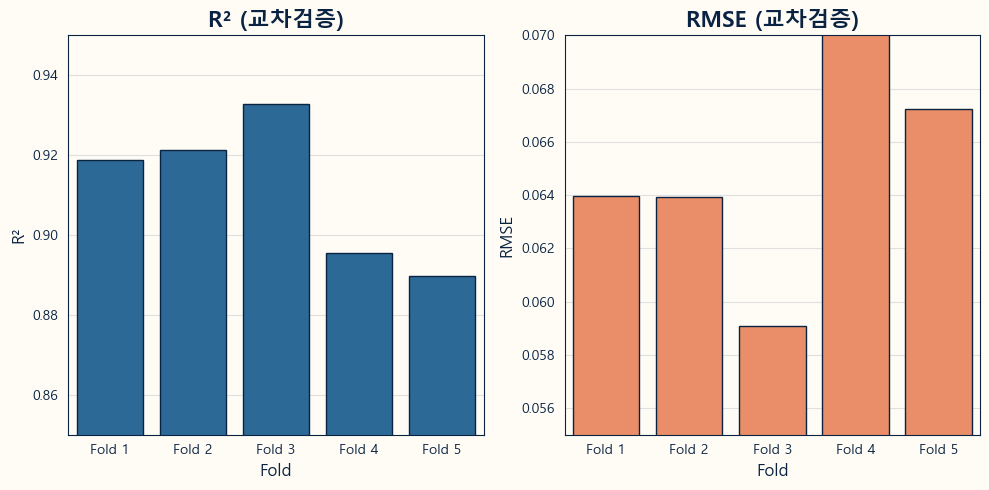

In [ ]:
# 스타일 적용
apply_navistyle()

# 교차검증 결과 시각화 (y축 범위 조정하여 표시)
plt.figure(figsize=(10, 5))

# R² 그래프
plt.subplot(1, 2, 1)
sns.barplot(
    x=["Fold 1", "Fold 2", "Fold 3", "Fold 4", "Fold 5"],
    y=r2_scores,
    color=navipalette["ocean_blue"],
    edgecolor=navipalette["deep_navy"]
)
plt.ylim(0.85, 0.95)
plt.title("R² (교차검증)")
plt.xlabel("Fold")
plt.ylabel("R²")

# RMSE 그래프
plt.subplot(1, 2, 2)
sns.barplot(
    x=["Fold 1", "Fold 2", "Fold 3", "Fold 4", "Fold 5"],
    y=rmse_scores,
    color=navipalette["sunset_orange"],
    edgecolor=navipalette["deep_navy"]
)
plt.ylim(0.055, 0.07)
plt.title("RMSE (교차검증)")
plt.xlabel("Fold")
plt.ylabel("RMSE")

plt.tight_layout()
plt.show()


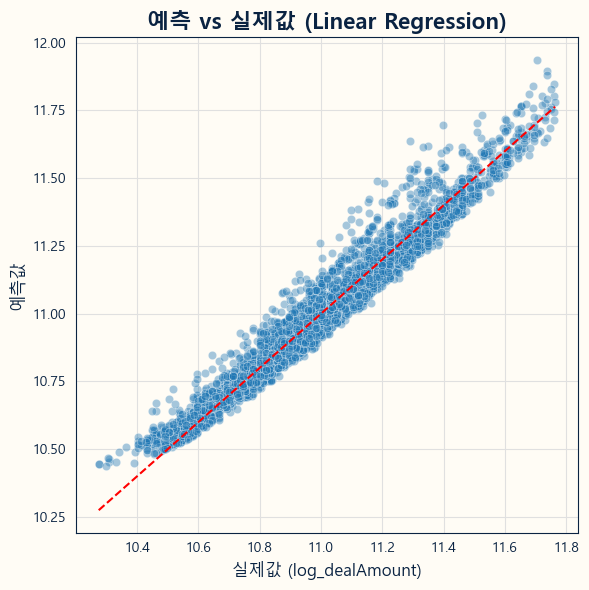

In [ ]:
from sklearn.model_selection import train_test_split

# 데이터셋 나누기 (같은 데이터프레임 기준)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 모델 학습
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# 예측 vs 실제 시각화
plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.4)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.xlabel("실제값 (log_dealAmount)")
plt.ylabel("예측값")
plt.title("예측 vs 실제값 (Linear Regression)")
plt.grid(True)
plt.tight_layout()
plt.show()


# 모델링_3 (Ridge)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# 데이터 불러오기
df = pd.read_csv('rename_final_df.csv')

# 타깃과 피처 정의
target = 'log_dealAmount'
# 공구(zone_1 ~ zone_10) 포함한 피처만 선택
drop_cols = ['sdNm', 'sggNm', 'umdNm', 'jibun', 'aptNm', 'dealDate', 'year_month',
             'full_address', 'brand','dealAmount', 'log_dealAmount']
features = [col for col in df.columns if col not in drop_cols]

# 결측치 제거
df = df.dropna(subset=[target] + features)

# X, y 분리
X = df[features]
y = df[target]

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습/검증 분리
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ridge 회귀 (규제 강도 범위 지정)
ridge = RidgeCV(alphas=np.logspace(-4, 4, 50), cv=5)
ridge.fit(X_train, y_train)

# 예측
y_pred = ridge.predict(X_test)

# 평가 지표
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("🔧 Ridge Regression Results")
print(f"Best Alpha: {ridge.alpha_}")
print(f"R² Score: {r2:.4f}")
print(f"RMSE (log scale): {rmse:.4f}")
print(f"Approximate Relative Error: {np.expm1(rmse)*100:.2f}%")

# 중요 변수 확인 (계수 + 피처 이름 연결)
coef_df = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": ridge.coef_
}).sort_values(by="Coefficient", key=abs, ascending=False)

print("\n📊 Top Influential Features:")
print(coef_df.head(10))


🔧 Ridge Regression Results
Best Alpha: 2.559547922699533
R² Score: 0.9548
RMSE (log scale): 0.0573
Approximate Relative Error: 5.90%

📊 Top Influential Features:
                 Feature  Coefficient
1             pricePerpy     0.255406
0             excluUseAr     0.216439
6              longitude    -0.050023
15                zone_4    -0.030903
28  HousingSupplyRate(%)    -0.027504
13                zone_2     0.018344
17                zone_6    -0.015354
9    nearby_conveniences    -0.013269
23            brand_푸르지오     0.012911
27  Market Interest Rate     0.010492


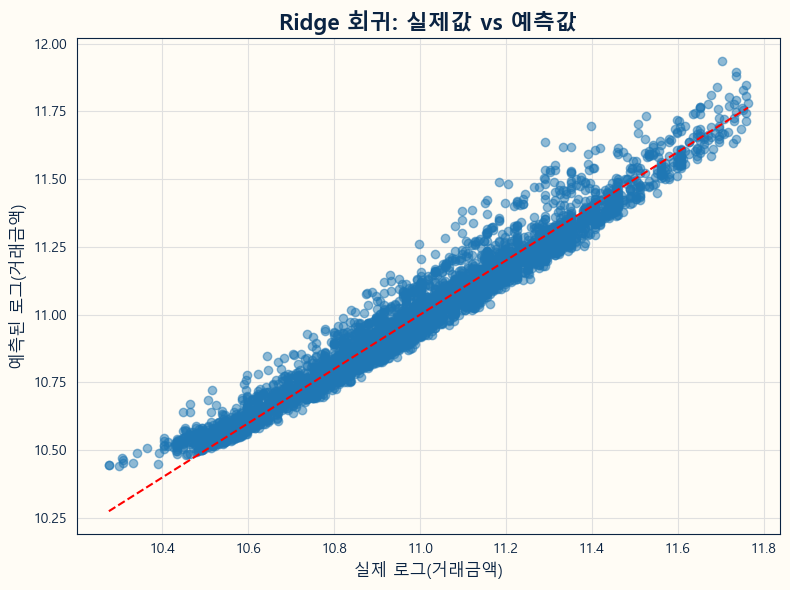

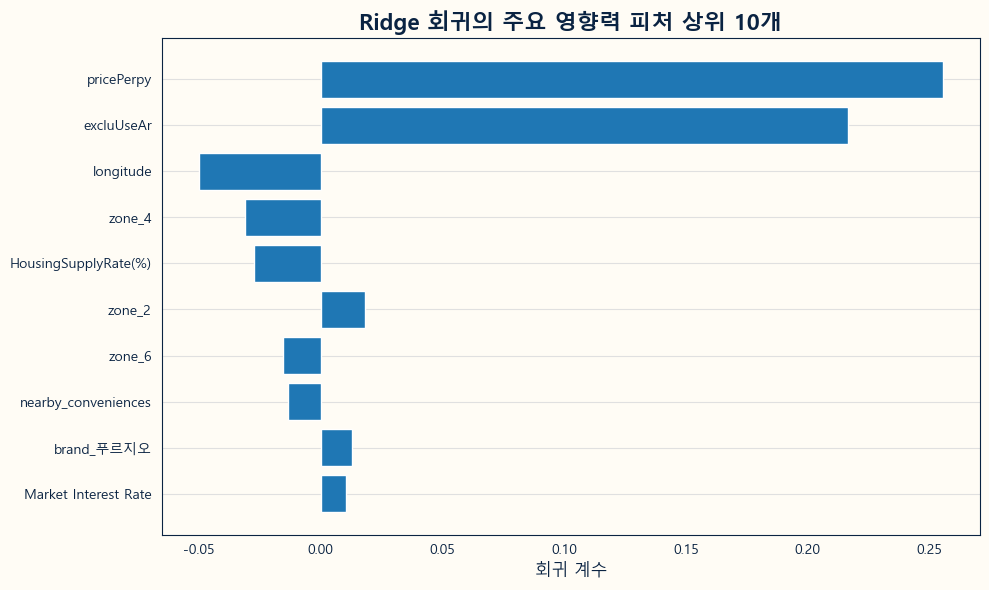

In [ ]:
import matplotlib.pyplot as plt

# 사용자 정의 스타일 함수 적용
apply_navistyle()

# 모델 계수를 다시 계산하여 DataFrame 생성 (피처 이름과 계수 연결)
coef_df = pd.DataFrame({
    "피처": X.columns,
    "회귀계수": ridge.coef_
}).sort_values(by="회귀계수", key=abs, ascending=False)

# 1. 실제값과 예측값 산점도 시각화
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("실제 로그(거래금액)")
plt.ylabel("예측된 로그(거래금액)")
plt.title("Ridge 회귀: 실제값 vs 예측값")
plt.grid(True)
plt.tight_layout()
plt.show()

# 2. 회귀 계수 시각화 (상위 10개 피처)
top_coef = coef_df.head(10)

plt.figure(figsize=(10, 6))
plt.barh(top_coef["피처"][::-1], top_coef["회귀계수"][::-1])
plt.xlabel("회귀 계수")
plt.title("Ridge 회귀의 주요 영향력 피처 상위 10개")
plt.grid(axis='x')
plt.tight_layout()
plt.show()


In [ ]:
r2_train = ridge.score(X_train, y_train)
r2_test = ridge.score(X_test, y_test)

print(f"R² (Train): {r2_train:.4f}")
print(f"R² (Test) : {r2_test:.4f}")
print(f"차이 (Train - Test): {r2_train - r2_test:.4f}")


R² (Train): 0.9553
R² (Test) : 0.9548
차이 (Train - Test): 0.0005


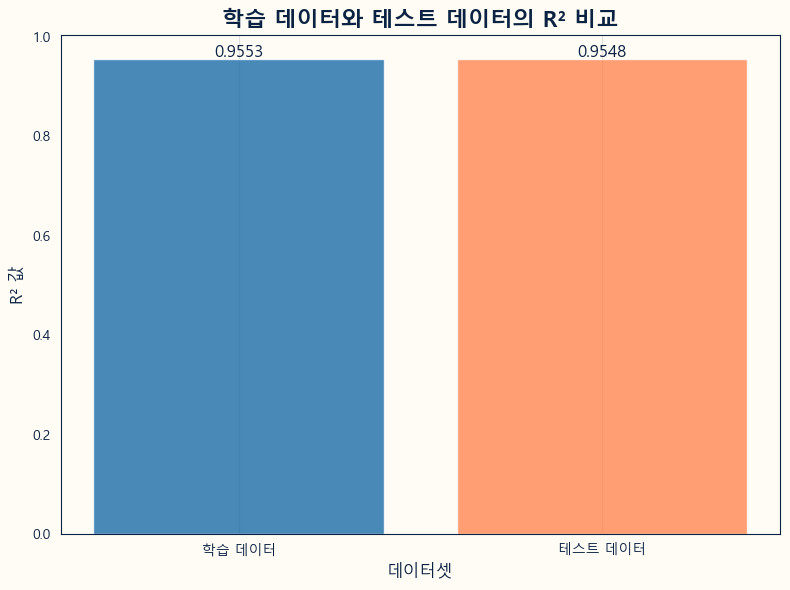

차이 (학습 데이터 - 테스트 데이터): 0.0005


In [ ]:
import matplotlib.pyplot as plt

# 사용자 정의 스타일 적용
apply_navistyle()

# R² 값 계산
r2_train = ridge.score(X_train, y_train)
r2_test = ridge.score(X_test, y_test)
diff = r2_train - r2_test

# 바 차트 생성
plt.figure(figsize=(8, 6))
datasets = ['학습 데이터', '테스트 데이터']
scores = [r2_train, r2_test]
colors = [navipalette["ocean_blue"], navipalette["sunset_orange"]]

bars = plt.bar(datasets, scores, color=colors, alpha=0.8)
plt.xlabel('데이터셋')
plt.ylabel('R² 값')
plt.title('학습 데이터와 테스트 데이터의 R² 비교')

# R² 수치 표시
for i, score in enumerate(scores):
    plt.text(i, score + 0.005, f'{score:.4f}', ha='center', fontsize=12, color=navipalette["deep_navy"])

plt.grid(axis='y')
plt.tight_layout()
plt.show()
# R² 값 차이 출력
print(f"차이 (학습 데이터 - 테스트 데이터): {diff:.4f}")


#### ✅ 과적합 점검 결과

| 지표 | 값 | 해석 |
|------|------|------|
| **Train R²** | 0.9553 | 훈련 데이터 설명력 |
| **Test R²** | 0.9548 | 검증 데이터 설명력 |
| **차이** | 0.0005 | 오차 거의 없음 |

📌 **훈련 vs 검증 성능 차이가 거의 없으므로, 과적합은 전혀 의심되지 않습니다.**  
모델이 **일반화가 매우 잘 되어 있고**, 안정적으로 학습되었다는 신호입니다.

---

#### ✅ VIF 관련 정리

- `zone_1~10` 간 **완전한 선형 종속성**은 있었지만,
- **Ridge 회귀**는 이런 다중공선성을 **자동으로 완화**하므로 걱정 없습니다.
- 현재 계수들도 합리적 범위에 있어, Ridge가 **매우 효과적으로 작동**한 것으로 보입니다.

---

#### ✅ 결론

> 현재 모델은 **과적합도 아니고**, **다중공선성 문제도 잘 해결된 상태**입니다.  
> 예측력도 우수(R² ≈ 0.955), 오차율도 낮음(RMSE ≈ 5.9%).

# Ridge, Lasso, ElasticNet 모델을 활용한 성능비교, 계수 비교, 변수 선택 차이 확인

In [ ]:
# 스케일링 (필수!)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 모델 학습 (CV 포함)
ridge = RidgeCV(alphas=np.logspace(-3, 3, 100), cv=5)
lasso = LassoCV(alphas=np.logspace(-3, 3, 100), cv=5, max_iter=10000)
elastic = ElasticNetCV(alphas=np.logspace(-3, 3, 100), l1_ratio=[.1, .5, .7, .9, .95, .99, 1], cv=5, max_iter=10000)

ridge.fit(X_train_scaled, y_train)
lasso.fit(X_train_scaled, y_train)
elastic.fit(X_train_scaled, y_train)

# 예측
models = {'Ridge': ridge, 'Lasso': lasso, 'ElasticNet': elastic}
results = []

for name, model in models.items():
    y_pred = model.predict(X_test_scaled)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    results.append({'Model': name, 'RMSE': rmse, 'R2': r2})

results_df = pd.DataFrame(results)

# 성능 비교 출력
print(results_df)

        Model      RMSE        R2
0       Ridge  0.057339  0.954813
1       Lasso  0.057929  0.953879
2  ElasticNet  0.057336  0.954818


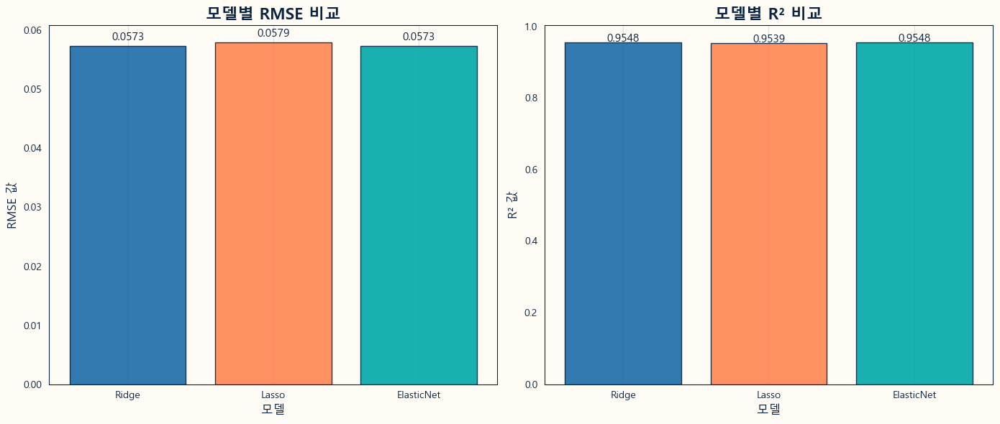

In [ ]:
model_colors = {
    'Ridge': navipalette["ocean_blue"],
    'Lasso': navipalette["sunset_orange"],
    'ElasticNet': '#00A8A8'  # 새로운 청록색
}


# 색상 리스트 생성
bar_colors = [model_colors.get(model, navipalette["deep_navy"]) for model in results_df['Model']]

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# RMSE 그래프
axes[0].bar(results_df['Model'], results_df['RMSE'], color=bar_colors, alpha=0.9, edgecolor=navipalette["deep_navy"])
axes[0].set_title('모델별 RMSE 비교')
axes[0].set_xlabel('모델')
axes[0].set_ylabel('RMSE 값')
for idx, value in enumerate(results_df['RMSE']):
    axes[0].text(idx, value + 0.001, f'{value:.4f}', ha='center', fontsize=11, color=navipalette["deep_navy"])
axes[0].grid(axis='y')

# R² 그래프
axes[1].bar(results_df['Model'], results_df['R2'], color=bar_colors, alpha=0.9, edgecolor=navipalette["deep_navy"])
axes[1].set_title('모델별 R² 비교')
axes[1].set_xlabel('모델')
axes[1].set_ylabel('R² 값')
for idx, value in enumerate(results_df['R2']):
    axes[1].text(idx, value + 0.002, f'{value:.4f}', ha='center', fontsize=11, color=navipalette["deep_navy"])
axes[1].grid(axis='y')

plt.tight_layout()
plt.show()


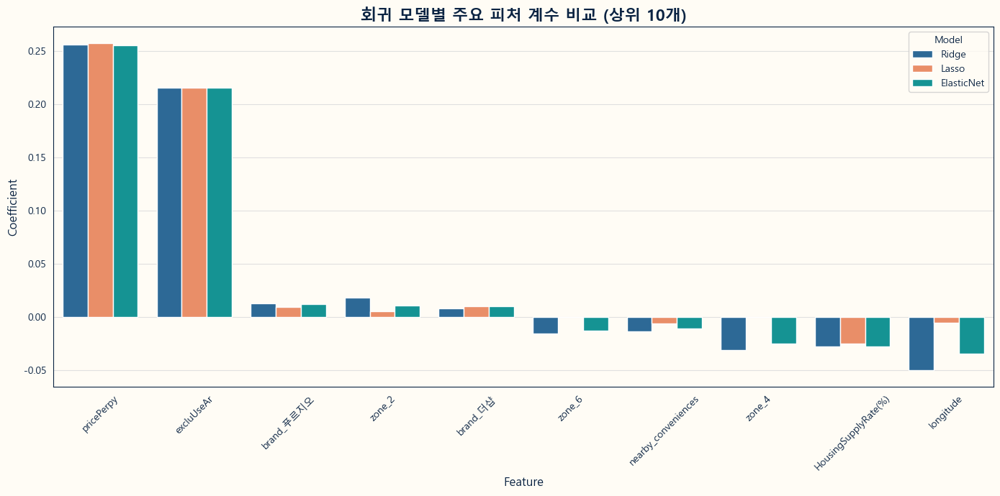

In [ ]:
apply_navistyle()

# 계수 정리
coef_df = pd.DataFrame({
    'Feature': X.columns,
    'Ridge': ridge.coef_,
    'Lasso': lasso.coef_,
    'ElasticNet': elastic.coef_
})

# melt
coef_melted = coef_df.melt(id_vars='Feature', var_name='Model', value_name='Coefficient')

# 중요 피처 추출: 평균 계수 절댓값 상위 10개
top_features = coef_df.set_index("Feature").abs().mean(axis=1).sort_values(ascending=False).head(10).index.tolist()
filtered_coef = coef_melted[coef_melted['Feature'].isin(top_features)]

# 피처 정렬 (평균 계수 기준)
order = filtered_coef.groupby("Feature")["Coefficient"].mean().sort_values(ascending=False).index

# 시각화
plt.figure(figsize=(14, 7))
sns.barplot(
    data=filtered_coef,
    x='Feature',
    y='Coefficient',
    hue='Model',
    palette=model_colors,
    order=order
)
plt.title("회귀 모델별 주요 피처 계수 비교 (상위 10개)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


부동산 시장 분석이나 프롭테크 분야처럼 **예측력도 중요하고, 왜 그런 예측이 나왔는지 설명도 중요할 때**는 `ElasticNet`이 정말 좋은 선택이라 판단됩니다.
#### ✅ ElasticNet을 선택해야 하는 상황

| 상황 | 설명 |
|------|------|
| 📈 **예측 성능이 중요** | 실거래가나 향후 매매가 예측 |
| 🧠 **변수 해석이 중요** | "왜 이 지역이 높은 가격이 나왔나?", "어떤 요소가 영향을 미쳤나?" |
| 🔄 **다중공선성 존재** | ex) `zone_3`, `zone_4`, `longitude`, `brand_*` 등 비슷한 정보 가진 변수들이 많음 |
| 🧹 **불필요한 변수 제거 필요** | 너무 많은 feature로 과적합 방지 + 해석력 향상 |
---
#### ⚖️ ElasticNet이 해주는 역할 요약
- **Ridge처럼**: 계수 크기를 안정적으로 조절해서 과적합 방지
- **Lasso처럼**: 불필요한 변수는 계수를 0으로 만들어 제거
- → 두 개의 장점을 **적절히 조합**합니다.
---
- `l1_ratio = 0`이면 Ridge와 같고
- `l1_ratio = 1`이면 Lasso와 같아
- **ElasticNetCV는 이 사이의 최적 비율을 자동으로 찾습니다.**

# ElasticNetCV의 최적 비율을 찾아 모델 설정

In [ ]:
from sklearn.linear_model import ElasticNetCV

elastic_cv = ElasticNetCV(
    alphas=np.logspace(-6, 3, 1000),        # 0.000001 ~ 1000 사이 세밀 탐색
    l1_ratio=np.linspace(0.05, 1.0, 50),    # L1 비율 5% 단위로 촘촘하게
    cv=5,
    max_iter=50000,
    n_jobs=-1,
    random_state=42
)

# 2. 모델 학습
elastic_cv.fit(X_train_scaled, y_train)

# 3. 최적 파라미터 출력
print("최적 alpha:", elastic_cv.alpha_)
print("최적 l1_ratio:", elastic_cv.l1_ratio_)


최적 alpha: 9.20373199661823e-06
최적 l1_ratio: 1.0


#### ✅ 결과 해석

| 파라미터 | 값 | 의미 |
|----------|------|------|
| `alpha` | `9.20e-06` (≈ 0.0000092) | **매우 낮은 정규화 강도** → 거의 규제를 안 하는 수준 |
| `l1_ratio` | `1.0` | 사실상 **Lasso 회귀와 동일**함 |

---

#### 🔍 해석: 모델이 말하는 것

1. **정규화를 거의 하지 않아도 충분히 학습이 잘 된다**
   - → 데이터의 품질이 좋아서 과도한 정규화가 필요 없다고 판단됩니다.
   - → 또는 주요 변수가 명확해서 규제를 약하게 걸어도 과적합이 안 생깁니다.

2. **완전히 Lasso 쪽으로 치우쳐 있음**
   - → Ridge보단 **불필요한 변수 제거와 해석력**에 초점을 둘 수 있습니다.
   - → 이 경우, 사실상 **ElasticNet은 의미 없고 그냥 Lasso가 더 간단합니다.**

---

#### 🎯 **실무적 조언**

#### 지금 모델의 상황은?
- ElasticNet 썼지만, 결과적으로 `l1_ratio = 1.0` → **Lasso와 동일**
- `alpha ≈ 0.000009` → 아주 약한 정규화 → 모델이 **거의 OLS처럼 동작**

---
#### ✏️ 정리된 한 줄 요약:
**ElasticNetCV가 선택한 최적 하이퍼파라미터는 사실상 Lasso와 같으며, 모델은 정규화보다는 변수 선택을 중심으로 해석하려는 경향이 강합니다.**


## ⚖️ ElasticNet 해석 보완

- 이번 분석에서 `l1_ratio = 1.0`으로, ElasticNet이 사실상 **Lasso와 동일한 방식**으로 작동했습니다.
- 하지만 ElasticNet은 Ridge와 Lasso의 장점을 결합하는 모델로, **다른 데이터셋이나 변수 구조에서는 유용**할 수 있습니다.
- → ElasticNet 자체가 의미 없다는 것이 아니라, **이번 데이터에서만 Lasso와 같았던 것**입니다.


# LassoCV로 모델 재학습 및 중요변수 확인

In [ ]:
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# 데이터 불러오기
df = pd.read_csv('rename_final_df.csv')

# 타깃과 피처 정의
target = 'log_dealAmount'
# 공구(zone_1 ~ zone_10) 포함한 피처만 선택
drop_cols = ['sdNm', 'sggNm', 'umdNm', 'jibun', 'aptNm', 'dealDate', 'year_month',
             'full_address', 'brand','dealAmount', 'log_dealAmount']
features = [col for col in df.columns if col not in drop_cols]

# 결측치 제거
df = df.dropna(subset=[target] + features)

# X, y 분리
X = df[features]
y = df[target]

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습/검증 분리
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# LassoCV 학습
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(X_scaled, y)

# 회귀 계수 추출
coef = pd.Series(lasso.coef_, index=X.columns)
coef


excluUseAr                    0.216371
pricePerpy                    0.257081
floor                         0.002915
buildYear                     0.000000
rent_conversion_rate          0.000000
latitude                      0.000000
longitude                    -0.005129
dist_to_nearest_station_m    -0.002315
dist_to_nearest_facility_m    0.000076
nearby_conveniences          -0.006008
nearby_transports            -0.003480
zone_1                        0.011687
zone_10                       0.006507
zone_2                        0.006053
zone_3                        0.000000
zone_4                       -0.000000
zone_5                       -0.000051
zone_6                       -0.000000
zone_7                       -0.000000
zone_8                       -0.002136
zone_9                        0.004428
brand_더샵                      0.010562
brand_자이                      0.003760
brand_푸르지오                    0.010305
brand_힐스테이트                  -0.005050
gtx_issue                

#### ✅ **전체 해석 구조**

#### 1. **계수가 0 → 제거된 변수**
- `buildYear` (건축연도)
- `rent_conversion_rate` (전월세 전환율)
- `latitude`, `gtx_issue`, `Policy Rate`, `zone_3~7` 등  
→ **설명력이 거의 없거나, 다른 변수로 설명이 중복되는 경우** Lasso가 자동 제거합니다..

- 🔎 이 변수들은 모델 예측에 영향 없음 → 제거 가능.

---

#### 2. **계수 > 0 → 가격과 양의 관계**
- `pricePerpy` (평당가격): **0.257** → 가장 영향력이 큼  
- `excluUseAr` (전용면적): **0.216**  
- `zone_1`, `zone_10`, `자이`, `더샵`, `푸르지오` 브랜드 등  
→ **이 값이 높을수록 log(아파트가격)이 올라갑니다.**

- 📈 큰 평당 가격 + 넓은 면적 + 프리미엄 브랜드 = 고가 아파트

---

#### 3. **계수 < 0 → 가격과 음의 관계**
- `HousingSupplyRate(%)`: **-0.0246** → **공급률이 높을수록 가격은 낮아집니다다**
- `nearby_conveniences`: **-0.0060**
- `brand_힐스테이트`: **-0.0050**
- `longitude`, `nearby_transports` 등도 소폭 음의 영향

- 📉 공급 많은 지역, 편의시설 많은 지역은 오히려 경쟁 심화로 가격 하락을 하는 것인지 확인이 필요합니다.(예상)

---

#### 📌 변수별 인사이트 정리

| 변수명 | 계수 | 해석 |
|-------|------|------|
| `pricePerpy` | +0.257 | 평당 가격이 높을수록 거래금액 상승 (직접 영향) |
| `excluUseAr` | +0.216 | 면적이 클수록 가격 증가 |
| `HousingSupplyRate(%)` | -0.025 | 공급률이 높으면 가격 하락 가능성 |
| `brand_더샵/자이/푸르지오` | + | 프리미엄 브랜드 효과 존재 |
| `brand_힐스테이트` | -0.005 | 브랜드지만 다른 프리미엄 브랜드 대비 낮은 효과 |
| `zone_1`, `zone_10` | + | 특정 입지 구역이 긍정적 영향을 미침 |
| `gtx_issue`, `Policy Rate` 등 | 0 | 모델이 무시함 (다른 변수로 설명되거나 영향 미미) |

---

#### ✅ 전체 요약

- **중요한 변수**: 평당가격, 전용면적, 브랜드, 일부 입지 zone
- **거의 영향 없는 변수**: 건축연도, 위도, GTX이슈, 정책금리 등 → 제거 가능합니다.
- **부정적 영향**: 공급률, 일부 편의/교통 접근성 → 수요보다 공급 또는 경쟁 과다로 인한 것으로 예상해봅니다.


# Lasso로 변수 제거

In [ ]:
lasso_coef = pd.Series(lasso.coef_, index=X.columns)
removed_features = lasso_coef[lasso_coef == 0].index.tolist()
print(f"Lasso가 제거한 변수 수: {len(removed_features)}개")
for var in removed_features:
    print("-", var)

Lasso가 제거한 변수 수: 9개
- buildYear
- rent_conversion_rate
- latitude
- zone_3
- zone_4
- zone_6
- zone_7
- gtx_issue
- Policy Rate


# 주요 영향 변수 추출

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\2105322616.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_coef.values, y=top_coef.index, palette="Blues_r")


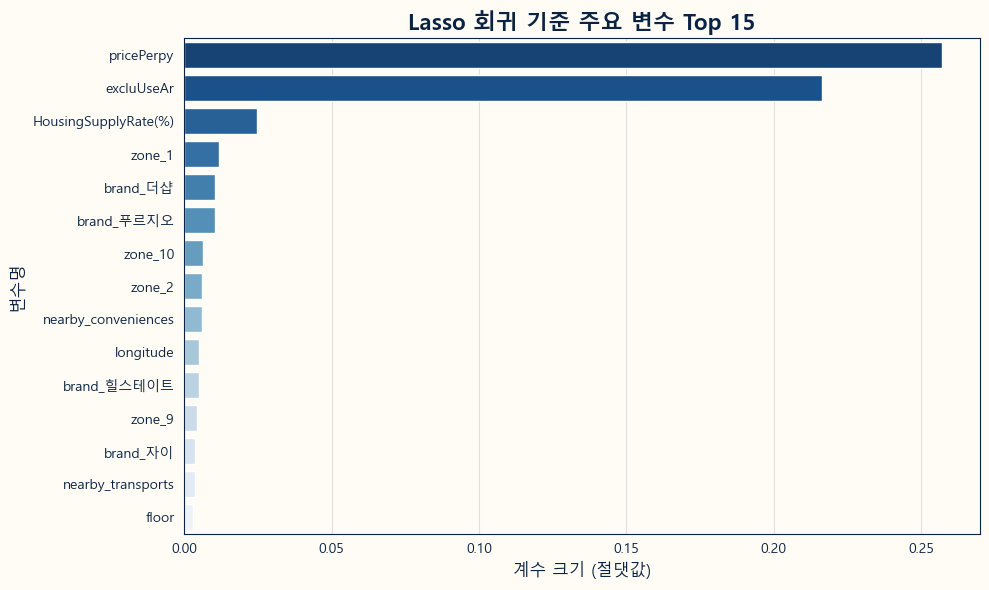

In [ ]:
# 중요 변수 추출
nonzero_coef = lasso_coef[lasso_coef != 0]
top_coef = nonzero_coef.abs().sort_values(ascending=False).head(15)

# 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x=top_coef.values, y=top_coef.index, palette="Blues_r")
plt.title("Lasso 회귀 기준 주요 변수 Top 15")
plt.xlabel("계수 크기 (절댓값)")
plt.ylabel("변수명")
plt.tight_layout()
plt.show()


#### **LassoCV 모델 결과 요약**

#### 📉 **모델이 제거한 변수**:
Lasso는 다음과 같은 변수들의 계수를 **0**으로 만들어 모델에서 제거하였습니다.:
- `buildYear` (건축연도)  
- `rent_conversion_rate` (전월세 전환율)  
- `latitude` (위도)  
- `zone_3`, `zone_4`, `zone_6`, `zone_7`  
- `gtx_issue` (GTX 이슈 여부)  
- `Policy Rate` (기준금리)
---

#### 🔍 전체적인 해석 요약
- **가장 큰 영향을 주는 변수 2개**가 독보적이고,
- 그 외 변수들은 상대적으로 영향력이 작지만, 의미 있는 신호를 갖고 있습니다..
- Lasso는 **불필요한 변수는 제거하고**, 이 핵심 변수들만 남깁니다.
---

#### ✅ 변수별 해석 (상위 중요 변수 중심)

| 변수명 | 해석 | 영향 방향 (추정) |
|--------|------|----------------|
| `pricePerpy` | 평당 가격 (만 원) – 전체 거래금액과 가장 직접적인 연관 | **양(+)** |
| `excluUseAr` | 전용면적 (㎡) – 면적이 클수록 가격 상승 | **양(+)** |
| `HousingSupplyRate(%)` | 주택 공급률 – 공급 많을수록 가격 억제 가능성 | **음(-)** or 약한 상관 |
| `zone_1` | 특정 zone에 위치한 경우 – 상대적으로 고가 지역일 가능성 | **양(+)** |
| `brand_더샵`, `brand_푸르지오` | 특정 브랜드 – 시장에서 선호도가 높아 가격에 긍정적 영향 | **양(+)** |
| `zone_10`, `zone_2`, `zone_9` | 특정 공구(zone) 더미 – 입지별 차이 반영 | 혼합 가능성 |
| `longitude` | 경도 – 동쪽/서쪽 방향에 따른 입지 차이 반영 | **음(-)** 가능 |
| `nearby_conveniences`, `nearby_transports` | 편의시설/교통시설 수 – 생활 접근성 반영 | **양(+)** |
| `brand_힐스테이트`, `brand_자이` | 다른 브랜드 효과 – 일부는 영향 미미 | 소폭 양(+) |
| `floor` | 층수 – 높을수록 프리미엄 여부에 따라 다름 | **약한 양(+)** 또는 무관 |

---

#### 📌 핵심 인사이트 요약
- **평당 가격과 전용면적**이 실거래가 예측에 가장 큰 영향을 줍니다.  
  → 이는 전형적인 **단가 × 면적** 구조와 부합합니다.
- **브랜드와 입지(zone) 효과**는 여전히 존재하지만, 절댓값은 작습니다.  
  → 하지만 해석적 인사이트로는 여전히 중요합니다.
- **공급률, 교통/편의시설, 경도** 같은 변수는 미묘한 입지 조건까지 설명 가능합니다.



## 🔍 변수 선택 해석 보완

- Lasso가 제거한 변수들(`gtx_issue`, `Policy Rate`, `zone_3~7`)은 반드시 영향이 없다는 의미는 아닙니다.
- 다른 변수들(예: `pricePerpy`, `brand_*`)이 이 변수들과 높은 상관관계를 가질 수 있으며, **설명력이 중복되기 때문에 제거**된 것으로 해석하는 것이 더 정확합니다.


In [ ]:
lasso_coef = pd.Series(lasso.coef_, index=X.columns)
selected_features = lasso_coef[lasso_coef != 0].index.tolist()
selected_features

['excluUseAr',
 'pricePerpy',
 'floor',
 'longitude',
 'dist_to_nearest_station_m',
 'dist_to_nearest_facility_m',
 'nearby_conveniences',
 'nearby_transports',
 'zone_1',
 'zone_10',
 'zone_2',
 'zone_5',
 'zone_8',
 'zone_9',
 'brand_더샵',
 'brand_자이',
 'brand_푸르지오',
 'brand_힐스테이트',
 'Market Interest Rate',
 'HousingSupplyRate(%)',
 'zone']

# Lasso를 활용해 선정된 변수를 바탕으로 OLS 재학습

In [ ]:
import pandas as pd
import statsmodels.api as sm

# 1. 사용할 X 변수 리스트
selected_features = [
 'excluUseAr',
 'pricePerpy',
 'floor',
 'longitude',
 'dist_to_nearest_station_m',
 'dist_to_nearest_facility_m',
 'nearby_conveniences',
 'nearby_transports',
 'zone_1',
 'zone_10',
 'zone_2',
 'zone_5',
 'zone_6',
 'zone_8',
 'zone_9',
 'brand_더샵',
 'brand_자이',
 'brand_푸르지오',
 'brand_힐스테이트',
 'Market Interest Rate',
 'HousingSupplyRate(%)'
]

# 2. X, y 정의
X_selected = X[selected_features].copy()
y_selected = y.copy()

# 3. 모든 값을 float으로 변환
X_selected = X_selected.astype(float)
y_selected = y_selected.astype(float)

# 4. 상수항 추가
X_selected_const = sm.add_constant(X_selected)

# 5. 결측치 제거
combined = pd.concat([X_selected_const, y_selected], axis=1).dropna()
X_clean = combined.drop(columns=y.name)
y_clean = combined[y.name]

# 6. OLS 학습
ols_model = sm.OLS(y_clean, X_clean).fit()

# 7. 결과 출력
print(ols_model.summary())


                            OLS Regression Results                            
Dep. Variable:         log_dealAmount   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                 2.414e+04
Date:                Wed, 16 Apr 2025   Prob (F-statistic):               0.00
Time:                        20:08:48   Log-Likelihood:                 34551.
No. Observations:               24116   AIC:                        -6.906e+04
Df Residuals:                   24094   BIC:                        -6.888e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

# 예측값 저장

In [ ]:
# 8. 예측값 생성
y_pred = ols_model.predict(X_clean)

# 9. 원본 데이터에 예측값 추가
result_df = combined.copy()
result_df['predicted_log_price'] = y_pred

# 10. CSV로 저장
result_df.to_csv('predicted_result.csv', index=False)
print("✅ 예측 결과가 'predicted_result.csv' 파일로 저장되었습니다.")

✅ 예측 결과가 'predicted_result.csv' 파일로 저장되었습니다.


In [ ]:
# 예측 결과와 식별 가능한 공통 컬럼 선택 (예: 경도, 전용면적, 층수)
merge_keys = ['longitude', 'excluUseAr', 'floor']

# 원본 데이터 로딩
df_base = pd.read_csv('rename_final_df.csv')

# 예측 결과에서 필요한 컬럼만 추출
predicted_part = result_df[merge_keys + ['predicted_log_price']]

# 병합 수행
merged_result = pd.merge(df_base, predicted_part, on=merge_keys, how='left')

# 저장
merged_result.to_csv('rename_final_df_with_prediction.csv', index=False)
print("✅ 예측 결과가 포함된 파일이 'rename_final_df_with_prediction.csv'로 저장되었습니다.")


✅ 예측 결과가 포함된 파일이 'rename_final_df_with_prediction.csv'로 저장되었습니다.


# 실제 값과 예측 값 비교

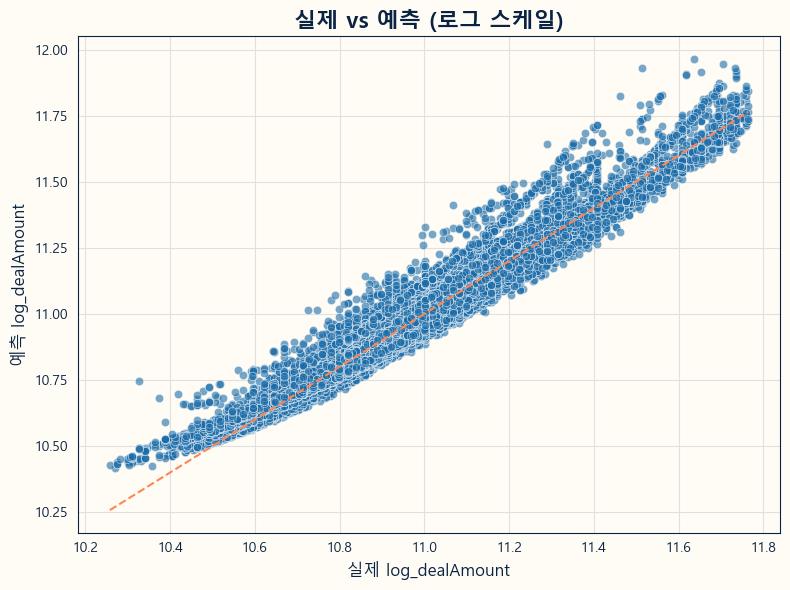

In [ ]:
# 실제 vs 예측 (로그 스케일)
apply_navistyle()
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_clean, y=y_pred, alpha=0.6, color=navipalette['ocean_blue'])
plt.plot([y_clean.min(), y_clean.max()], [y_clean.min(), y_clean.max()],
         color=navipalette['sunset_orange'], linestyle='--')
plt.xlabel("실제 log_dealAmount")
plt.ylabel("예측 log_dealAmount")
plt.title("실제 vs 예측 (로그 스케일)")
plt.grid(True)
plt.tight_layout()
plt.show()


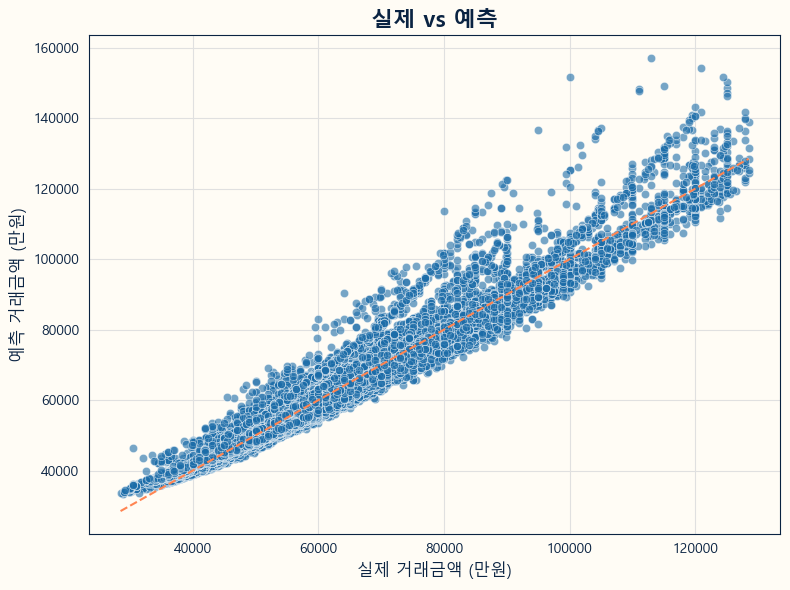

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

apply_navistyle()

# 예측값 계산
y_pred = ols_model.predict(X_clean)

# 로그 스케일을 해제한 실제값 및 예측값
y_real_exp = np.exp(y_clean)
y_pred_exp = np.exp(y_pred)

# 시각화
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_real_exp, y=y_pred_exp, alpha=0.6, color=navipalette['ocean_blue'])
plt.plot([y_real_exp.min(), y_real_exp.max()],
         [y_real_exp.min(), y_real_exp.max()],
         color=navipalette['sunset_orange'], linestyle='--')
plt.xlabel("실제 거래금액 (만원)")
plt.ylabel("예측 거래금액 (만원)")
plt.title("실제 vs 예측")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# 1. 예측 및 실제값 복원 (exp)
y_pred = ols_model.predict(X_clean)
y_real_exp = np.exp(y_clean)
y_pred_exp = np.exp(y_pred)

# 2. RMSE, MAE, MAPE, R² 계산
rmse = np.sqrt(mean_squared_error(y_real_exp, y_pred_exp))
mae = mean_absolute_error(y_real_exp, y_pred_exp)
mape = np.mean(np.abs((y_real_exp - y_pred_exp) / y_real_exp)) * 100
r2 = r2_score(y_real_exp, y_pred_exp)

# 3. 결과 출력
print(f"📊 예측 성능 요약 (실제 거래금액 기준):")
print(f"✅ RMSE : {rmse:,.2f} 원")
print(f"✅ MAE  : {mae:,.2f} 원")
print(f"✅ MAPE : {mape:.2f}%")
print(f"✅ R²   : {r2:.4f}")


📊 예측 성능 요약 (실제 거래금액 기준):
✅ RMSE : 4,111.39 원
✅ MAE  : 2,810.23 원
✅ MAPE : 4.38%
✅ R²   : 0.9451


# zone별 평균 예측값 vs 실제값 비교

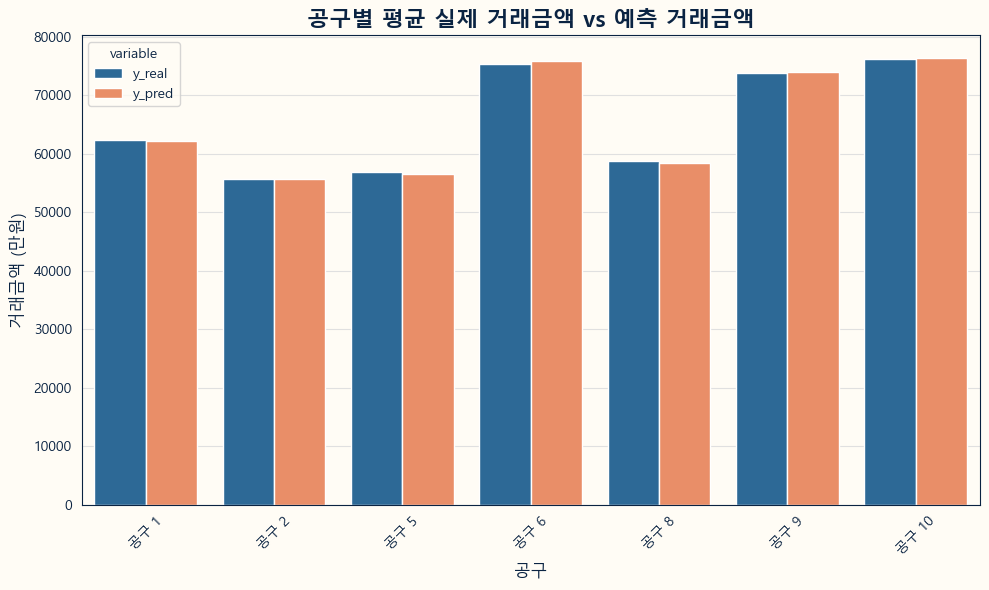

In [ ]:
# zone 컬럼만 선택
zone_cols = [col for col in X_selected if col.startswith("zone_")]
zone_df = X_selected[zone_cols].idxmax(axis=1).str.replace("zone_", "공구 ")

# 로그값 역변환
y_pred_real = np.exp(y_pred)
y_real = np.exp(y_clean)

# 비교용 데이터프레임 생성
compare_df = pd.DataFrame({
    "zone": zone_df,
    "y_real": y_real,
    "y_pred": y_pred_real
})

# 공구별 평균값 계산
zone_grouped = compare_df.groupby("zone").mean().reset_index()
zone_grouped['zone_num'] = zone_grouped['zone'].str.extract(r"(\d+)").astype(int)
zone_grouped = zone_grouped.sort_values("zone_num").drop(columns="zone_num")

# 시각화
plt.figure(figsize=(10, 6))
sns.barplot(data=zone_grouped.melt(id_vars="zone", value_vars=["y_real", "y_pred"]),
            x="zone", y="value", hue="variable",
            palette={"y_real": navipalette['ocean_blue'], "y_pred": navipalette['sunset_orange']})
plt.title("공구별 평균 실제 거래금액 vs 예측 거래금액")
plt.ylabel("거래금액 (만원)")
plt.xlabel("공구")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


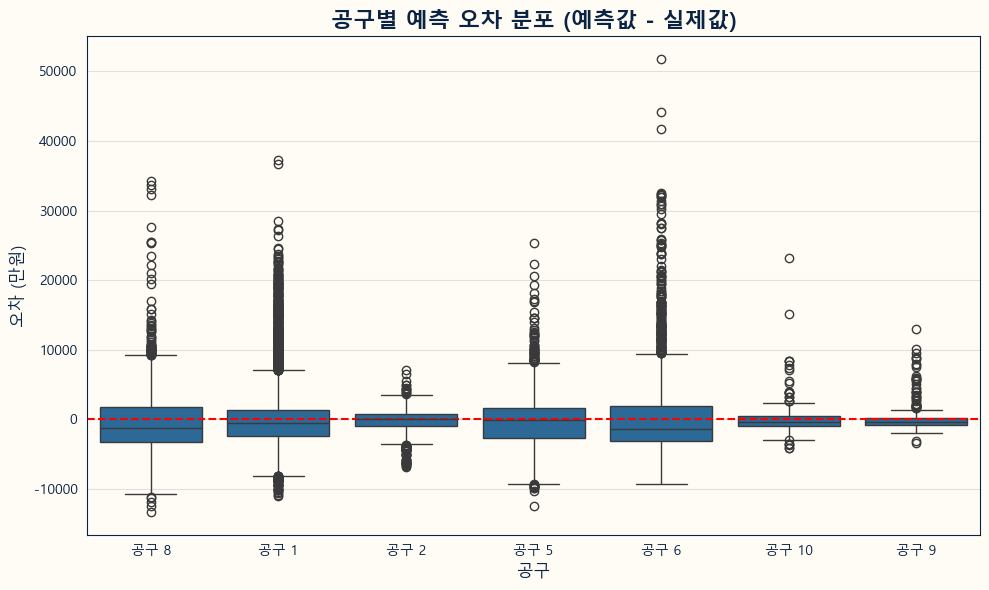

In [ ]:
# zone별 평균 예측과 실제의 차이 계산
zone_grouped["diff"] = zone_grouped["y_pred"] - zone_grouped["y_real"]
zone_grouped["abs_diff"] = zone_grouped["diff"].abs()

# 편차가 큰 순으로 정렬
zone_diff_sorted = zone_grouped.sort_values("abs_diff", ascending=False)

# 공구 리스트 추출
top_zones = zone_diff_sorted["zone"].tolist()

# 해당 공구들의 거래 데이터 추출
focus_df = compare_df[compare_df["zone"].isin(top_zones)].copy()
focus_df["error"] = focus_df["y_pred"] - focus_df["y_real"]
focus_df["abs_error"] = focus_df["error"].abs()

# 박스플롯 시각화
apply_navistyle()
plt.figure(figsize=(10, 6))
sns.boxplot(data=focus_df, x="zone", y="error", color=navipalette['ocean_blue'])
plt.axhline(0, color='red', linestyle='--')
plt.title("공구별 예측 오차 분포 (예측값 - 실제값)")
plt.ylabel("오차 (만원)")
plt.xlabel("공구")
plt.tight_layout()
plt.show()

# 편차 큰 거래 Top 10
top_errors = focus_df.sort_values("abs_error", ascending=False).head(10)


In [ ]:
# 비교용 데이터프레임 생성
compare_df = pd.DataFrame({
    "zone": zone_df,
    "y_real": y_real,
    "y_pred": y_pred_real,
})
compare_df["error"] = compare_df["y_pred"] - compare_df["y_real"]
compare_df["abs_error"] = compare_df["error"].abs()

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\270252864.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


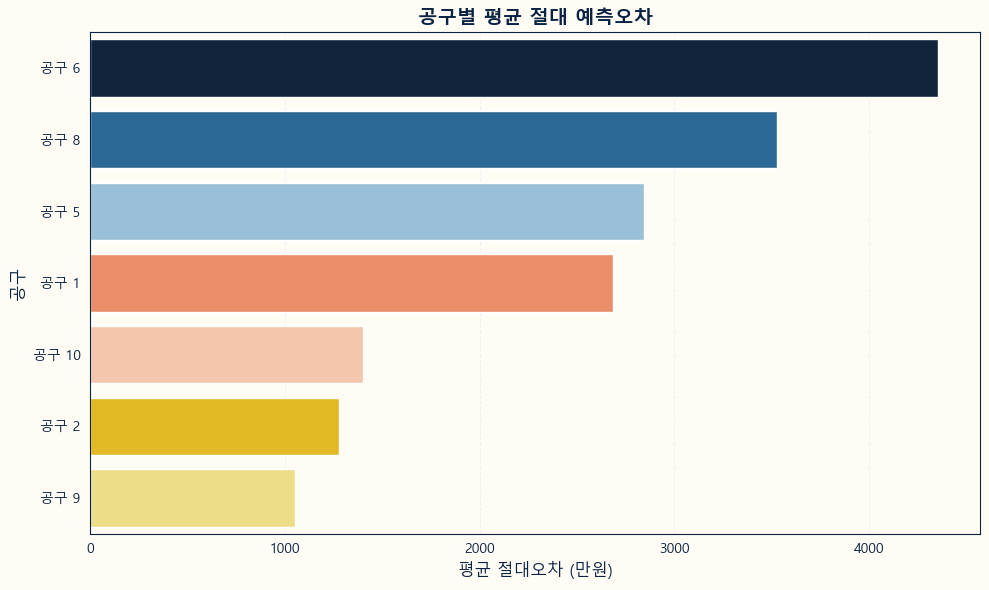

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 공구별 평균 절대오차 계산
zone_error_df = compare_df.groupby("zone")["abs_error"].mean().reset_index()
zone_error_df = zone_error_df.sort_values("abs_error", ascending=False)

# 색상 조합: navipalette에서 톤 다르게 확장 (중복 방지)
custom_palette = [
    "#0A2342",  # deep_navy
    "#1B6CA8",  # ocean_blue
    "#8FC1E3",  # 밝은 블루 계열
    "#FF8552",  # sunset_orange
    "#FFC3A1",  # 오렌지 톤 부드럽게
    "#FFCB05",  # star_yellow
    "#FFE877",  # 노랑 연하게
    "#D9CBA3",  # sand_beige
    "#B5B682",  # 카키 파스텔
    "#FFFCF5",  # sail_white
    "#EAEAEA",  # 연회색
    "#C3D7DF",  # 회색+블루 느낌
]

# 공구 수에 맞게 자르기
n = zone_error_df.shape[0]
palette_final = custom_palette[:n]

# 시각화
plt.figure(figsize=(10, 6))
sns.barplot(
    data=zone_error_df,
    x="abs_error",
    y="zone",
    palette=palette_final
)
plt.title("공구별 평균 절대 예측오차", fontsize=14)
plt.xlabel("평균 절대오차 (만원)")
plt.ylabel("공구")
plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


# **---------------------------------------------------**

# 🤖 오차 큰 단지만 별도 모델 보정 실험

### 공구 1 오차 이유 및 분석 필요성

공구 1에서 예측값과 실제값 사이의 차이(오차)가 유독 크게 나타나는 이유는 단순한 모델 성능 문제를 넘어, 구조적 요인에 기인할 가능성이 높습니다. 다음은 공구 1의 오차가 큰 이유를 탐색한 결과입니다.

#### 1. 공구 1 내부 이질성 (단지 간 차이)
공구 1은 송도 초기에 개발된 지역으로, 단지 간 가격 차이가 매우 큽니다. 예를 들어, 오래된 구축 단지와 신축 단지, 저가 단지와 고가 브랜드 단지가 혼재되어 있습니다. 이 경우, 평균값 기반의 예측 모델은 중간값에 수렴하는 경향이 있어 저가 단지는 과대평가되고, 고가 단지는 과소평가되는 현상이 발생합니다. 이는 Boxplot에서 오차의 분산이 크고 이상치가 많은 이유로 설명될 수 있습니다.

#### 2. 브랜드나 입지 등의 세부 특성 미반영
같은 공구 1이라도 중앙공원 인접 단지와 내부쪽 낙후 단지의 시장 가격은 크게 다를 수 있습니다. 그러나 모델이 `zone_1`, `brand_더샵` 같은 더미 변수만 보고 있다면, 정확한 단지의 특성 차이를 인식하기 어려워집니다. 공구 1은 고급 입지와 일반 입지가 혼재된 복합적 지역으로, 단순 zone 또는 브랜드만으로 설명하기 어려운 구조입니다.

#### 3. 모델이 지역 편차보다 면적·단가에 민감하게 반응
현재 모델의 주요 변수는 `pricePerpy`, `excluUseAr`인데, 공구 1은 비슷한 면적과 단가라도 시장 가격 형성이 다르게 움직일 수 있는 지역입니다. 예를 들어, 향후 개발 계획이 없거나 오래된 기반시설이 있는 경우, 단순 수치 기반 변수만으로는 공구 1의 특이한 거래 패턴을 설명하기 부족할 수 있습니다.

### 실무적 시사점
공구 1의 예측 오차는 다음과 같은 실무적 시사점을 제공합니다:

| 관찰 | 시사점 |
|------|--------|
| 예측보다 실제가가 낮은 사례 다수 | 저가 구축이 많아 평균 예측값보다 거래가가 낮은 경우 |
| 예측보다 실제가가 높은 사례도 일부 존재 | 고급 단지가 평균에 묻혀 예측이 낮게 나옴 |
| 전반적으로 분산 큼 | 공구 1은 이질적인 요소가 많은 지역이라는 경고 신호 |

결론적으로, 공구 1은 예외적으로 집중 분석할 가치가 있으며, 그 목적은 개발 이슈가 아니라 '내부 이질성'에 대한 구조적 이해에 있습니다.

### 공구 1을 그냥 넘어가면 안 되는 이유
1. **예측 오차 분산이 지나치게 큼**: 공구 1의 오차 범위는 다른 공구들에 비해 압도적으로 크고 이상치도 많습니다. 이는 단일 zone 단위로 묶는 것이 실제 가격 분포를 설명하는 데 한계가 있음을 나타냅니다.
   
2. **내부 구성의 이질성**: 공구 1은 송도 초기 개발지구로, 구축/신축 단지, 브랜드 아파트와 비브랜드 단지, 초역세권과 외곽 단지가 혼재되어 있습니다. zone 1로만 분류했을 때 이 다양성이 반영되지 않아 모델이 '평균값'으로 수렴하는 경향이 발생합니다.

3. **실무적으로는 위험 요소**: 예측이 잘 맞지 않는 구역은 가격 예측 리스크, 수요 판단 실패 위험, 입지 추천 신뢰도 저하로 이어질 수 있습니다. 따라서 모델 관점에서 고위험 지역으로 분류하고, 따로 분해해서 분석하는 것이 신뢰도를 높일 수 있습니다.

### 공구 6·8과 공구 1의 차이
| 항목 | 공구 6·8 | 공구 1 |
|------|----------|---------|
| 예측 오차 | 체계적 편차 (예측값 ↑) | 비일관적 분산 (오차 폭 ↑) |
| 원인 | 정책/개발 이슈 | 내부 이질성, 평균 회귀 |
| 접근법 | 도메인 보완 (정책 변수 추가) | 데이터 분해 (단지/세부 특성 분석) |

### 공구 1 집중 분석이 필요한 이유 요약
공구 1은 예측의 신뢰도를 떨어뜨리는 주요 변수로, 이 지역에서 모델의 구조적 한계가 드러납니다. 분석의 목적은 "왜 이 공구에서만 예측이 흔들리는가"를 파악하여 모델 보정 또는 위험 신호 탐지 도구로 활용하기 위함입니다.

### 분석의 필요성 및 타당성
같은 공구(zone) 내에서도 미세한 입지에 따라 가격 차이가 존재하는 현실을 감안할 때, 송도 내에서도 해안가 조망권, 센트럴파크 인근, 지하철역 인근 지역 등 특정 위치적 프리미엄이 존재합니다. 따라서 위경도 좌표를 활용한 세부 지역별 고가/저가 분석은 매우 의미가 있습니다. 


# **---------------------------------------------------**

# 공구 1 필터링 및 위경도 클러스터링 → 지도 위 시각화

In [ ]:
zone1_df = df[df['zone'] == 1].copy()
zone1_df = zone1_df.dropna(subset=['longitude', 'latitude', 'log_dealAmount'])


In [ ]:
zone1_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4259 entries, 2 to 24110
Data columns (total 41 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   sdNm                        4259 non-null   object 
 1   sggNm                       4259 non-null   object 
 2   umdNm                       4259 non-null   object 
 3   jibun                       4259 non-null   object 
 4   aptNm                       4259 non-null   object 
 5   excluUseAr                  4259 non-null   float64
 6   dealDate                    4259 non-null   object 
 7   dealAmount                  4259 non-null   float64
 8   pricePerpy                  4259 non-null   float64
 9   floor                       4259 non-null   int64  
 10  buildYear                   4259 non-null   int64  
 11  year_month                  4259 non-null   object 
 12  rent_conversion_rate        4259 non-null   float64
 13  full_address                4259 non-

최적의 k값: 4


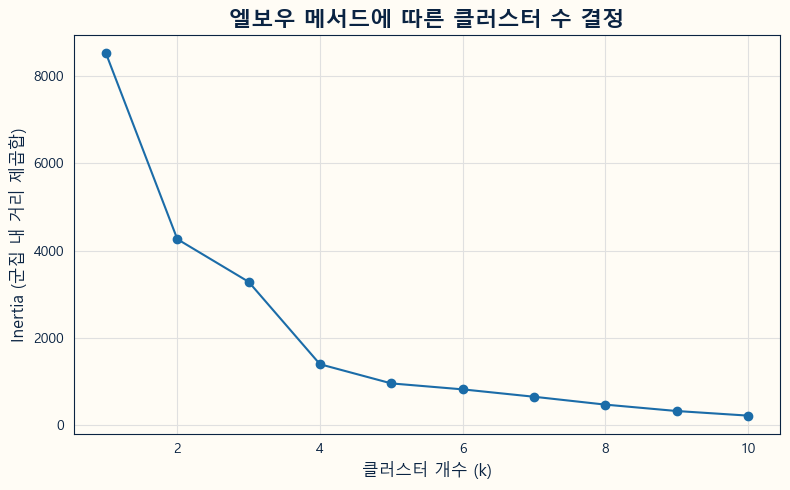

In [ ]:
# 엘보우 메서드 실행
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from kneed import KneeLocator


# 위경도 데이터 추출 및 표준화
coords = zone1_df[['longitude', 'latitude']]
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

# 엘보우 메서드: inertia 확인
inertias = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(coords_scaled)
    inertias.append(kmeans.inertia_)

kneedle = KneeLocator(k_range, inertias, curve='convex', direction='decreasing')
optimal_k = kneedle.elbow
print(f"최적의 k값: {optimal_k}")

# 시각화
apply_navistyle()
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertias, marker='o', color=navipalette['ocean_blue'])
plt.title("엘보우 메서드에 따른 클러스터 수 결정")
plt.xlabel("클러스터 개수 (k)")
plt.ylabel("Inertia (군집 내 거리 제곱합)")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# 클러스터링 수행 (위경도 기준)
coords = zone1_df[['longitude', 'latitude']]
kmeans = KMeans(n_clusters=4, random_state=42)
zone1_df['cluster'] = kmeans.fit_predict(coords)

In [ ]:
# 사용할 색상 추출 (클러스터 수만큼)
num_clusters = zone1_df['cluster'].nunique()
custom_palette = [
    navipalette["deep_navy"],
    navipalette["ocean_blue"],
    navipalette["sand_beige"],
    navipalette["sunset_orange"],
    navipalette["star_yellow"],
    navipalette["sail_white"]
][:num_clusters]  # 클러스터 수에 맞게 자르기

In [ ]:
import folium
from folium.plugins import MarkerCluster

# 항해사 스타일 색상 목록
navipalette_list = [
    navipalette["deep_navy"],
    navipalette["ocean_blue"],
    navipalette["sand_beige"],
    navipalette["sunset_orange"],
    navipalette["star_yellow"],
    navipalette["sail_white"]
]

# 클러스터 수
n_clusters = zone1_df['cluster'].nunique()

# 클러스터 수에 맞게 색상 반복 또는 잘라서 사용
custom_colors = (navipalette_list * ((n_clusters // len(navipalette_list)) + 1))[:n_clusters]

# 클러스터 → 색상 매핑
color_map = {i: custom_colors[i] for i in range(n_clusters)}

# 중심 좌표 설정 (송도 중심)
map_center = [zone1_df['latitude'].mean(), zone1_df['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 마커 클러스터
marker_cluster = MarkerCluster().add_to(m)

# 지도에 점 찍기
for _, row in zone1_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=4,
        color=color_map[row['cluster']],
        fill=True,
        fill_color=color_map[row['cluster']],
        fill_opacity=0.8,
        popup=f"📌 클러스터: {row['cluster']}<br>💰 가격: {round(np.exp(row['log_dealAmount'])):,}원"
    ).add_to(marker_cluster)

# 저장 및 출력
m.save("공구1_클러스터_지도_거래밀도.html")
m


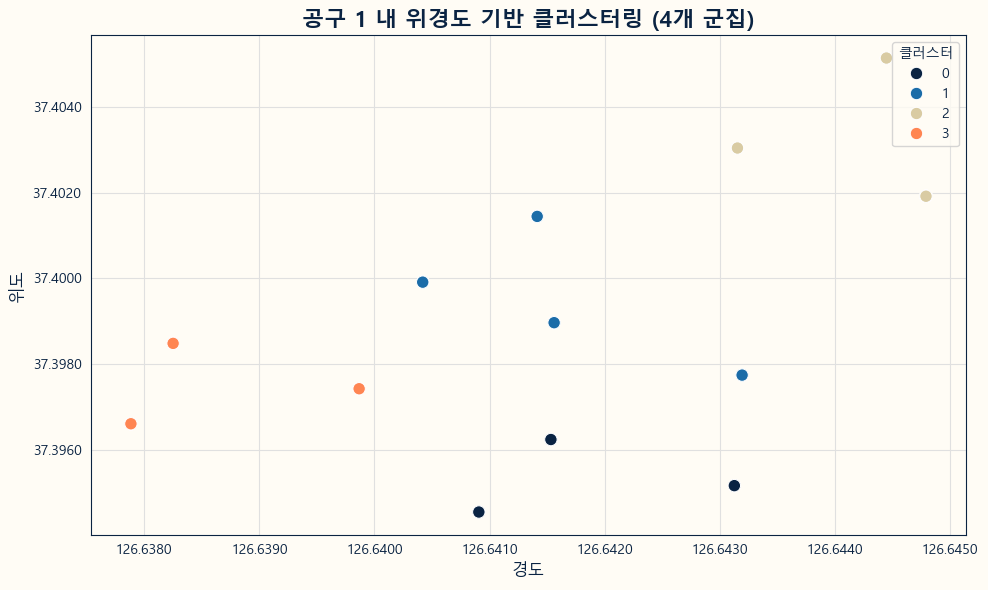

In [ ]:
from matplotlib.ticker import FuncFormatter

# 실 좌표로 축 표시 함수 정의
formatter = FuncFormatter(lambda x, _: f"{x:.4f}")

# 시각화 재작성
apply_navistyle()
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=zone1_df,
    x='longitude', y='latitude',
    hue='cluster',
    palette=custom_palette,
    s=80
)
plt.gca().xaxis.set_major_formatter(formatter)
plt.gca().yaxis.set_major_formatter(formatter)

plt.title("공구 1 내 위경도 기반 클러스터링 (4개 군집)")
plt.xlabel("경도")
plt.ylabel("위도")
plt.legend(title="클러스터")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
navipalette = {
    "deep_navy": "#0A2342",
    "ocean_blue": "#1B6CA8",
    "sand_beige": "#D9CBA3",
    "sunset_orange": "#FF8552",
    "star_yellow": "#FFCB05",
    "sail_white": "#FFFCF5"
}

import numpy as np

# 1. 실거래가 컬럼 생성
zone1_df['real_dealAmount'] = np.exp(zone1_df['log_dealAmount'])

# 2. 항해사 스타일 색상 한글 이름 매핑
navipalette_names = {
    navipalette["deep_navy"]: "깊은 바다색 (deep navy)",
    navipalette["ocean_blue"]: "바다 파랑 (ocean blue)",
    navipalette["sand_beige"]: "모래 베이지 (sand beige)",
    navipalette["sunset_orange"]: "노을 주황 (sunset orange)",
    navipalette["star_yellow"]: "별빛 노랑 (star yellow)",
    navipalette["sail_white"]: "돛단 하양 (sail white)"
}

# 3. 평균가격 계산
mean_price = zone1_df.groupby('cluster')['real_dealAmount'].mean().sort_values()

# 4. 클러스터별 색상 + 한글 이름 출력
print("📊 공구1 클러스터별 평균 실거래가 및 색상")
for cluster_id, price in mean_price.items():
    hex_color = color_map[cluster_id]  # 이건 folium 시각화 시 사용한 색상 매핑에서 가져와야 함
    color_name = navipalette_names.get(hex_color, "(알 수 없음)")
    print(f"클러스터 {cluster_id} | 평균가격: {round(price):,} 원 | 색상: {color_name}")


📊 공구1 클러스터별 평균 실거래가 및 색상
클러스터 1 | 평균가격: 62,679 원 | 색상: 바다 파랑 (ocean blue)
클러스터 2 | 평균가격: 64,687 원 | 색상: 모래 베이지 (sand beige)
클러스터 0 | 평균가격: 71,992 원 | 색상: 깊은 바다색 (deep navy)
클러스터 3 | 평균가격: 72,235 원 | 색상: 노을 주황 (sunset orange)


In [ ]:
import folium
from folium.plugins import MarkerCluster

# 항해사 스타일 색상 목록
navipalette_list = [
    navipalette["deep_navy"],
    navipalette["ocean_blue"],
    navipalette["sand_beige"],
    navipalette["sunset_orange"],
    navipalette["star_yellow"],
    navipalette["sail_white"]
]

# 클러스터 수
n_clusters = zone1_df['cluster'].nunique()

# 클러스터 수에 맞게 색상 반복 또는 잘라서 사용
custom_colors = (navipalette_list * ((n_clusters // len(navipalette_list)) + 1))[:n_clusters]

# 클러스터 → 색상 매핑
color_map = {i: custom_colors[i] for i in range(n_clusters)}

# 중심 좌표 설정 (송도 중심)
map_center = [zone1_df['latitude'].mean(), zone1_df['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 마커 클러스터
marker_cluster = MarkerCluster().add_to(m)

# 개별 마커로 색상 기반 클러스터 시각화
for _, row in zone1_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=4,
        color=color_map[row['cluster']],
        fill=True,
        fill_color=color_map[row['cluster']],
        fill_opacity=0.8,
        popup=f"""
        <b>클러스터:</b> {row['cluster']}<br>
        <b>실거래가:</b> {round(row['real_dealAmount']):,} 원
        """
    ).add_to(m)

# 저장 및 출력
m.save("공구1_클러스터_색상지도.html")
m


In [ ]:
# 항해사 스타일 색상 → 한글 이름 매핑
navipalette_names = {
    navipalette["deep_navy"]: "깊은 바다색",
    navipalette["ocean_blue"]: "바다 파랑",
    navipalette["sand_beige"]: "모래 베이지",
    navipalette["sunset_orange"]: "노을 주황",
    navipalette["star_yellow"]: "별빛 노랑",
    navipalette["sail_white"]: "돛단 하양"
}

# 클러스터별 평균 거리 및 가격 요약
cluster_summary = zone1_df.groupby('cluster')[[  
    'dist_to_nearest_station_m',
    'dist_to_nearest_facility_m',
    'log_dealAmount'
]].mean().rename(columns={
    'dist_to_nearest_station_m': '지하철거리(m)',
    'dist_to_nearest_facility_m': '공원거리(m)',
    'log_dealAmount': '평균log가격'
}).round(1)

# 실거래가 복원
cluster_summary["평균가격(원)"] = np.exp(cluster_summary["평균log가격"]).round(0).astype(int)

# 색상 한글 이름 추가
cluster_summary["색상"] = cluster_summary.index.map(lambda cid: navipalette_names.get(color_map[cid], "(알 수 없음)"))

# 결과 출력
print("📍 클러스터별 평균 거리 및 가격 + 색상")
display(cluster_summary[["지하철거리(m)", "공원거리(m)", "평균가격(원)", "색상"]])


📍 클러스터별 평균 거리 및 가격 + 색상


,지하철거리(m),공원거리(m),평균가격(원),색상
cluster,,,,
0,38.2,100.9,66171,깊은 바다색
1,67.6,77.8,59874,바다 파랑
2,125.0,236.6,66171,모래 베이지
3,69.5,92.2,73130,노을 주황


C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\213834957.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=[str(c) for c in clusters])


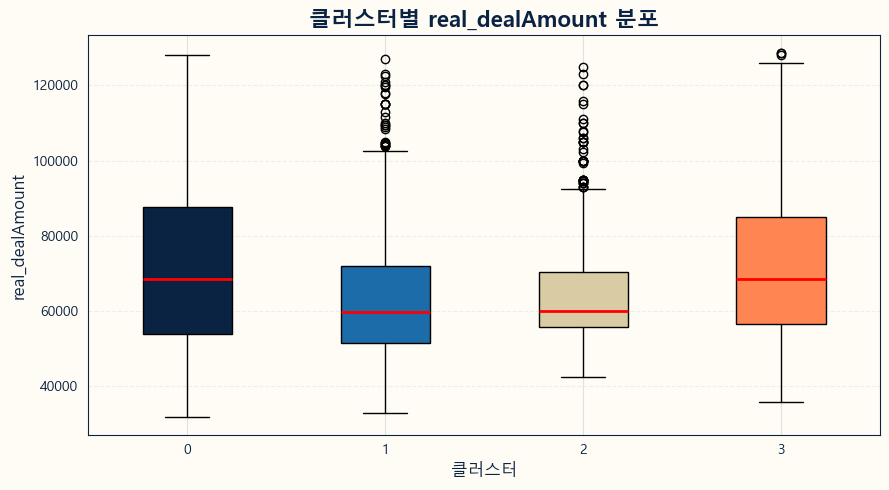

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\213834957.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=[str(c) for c in clusters])


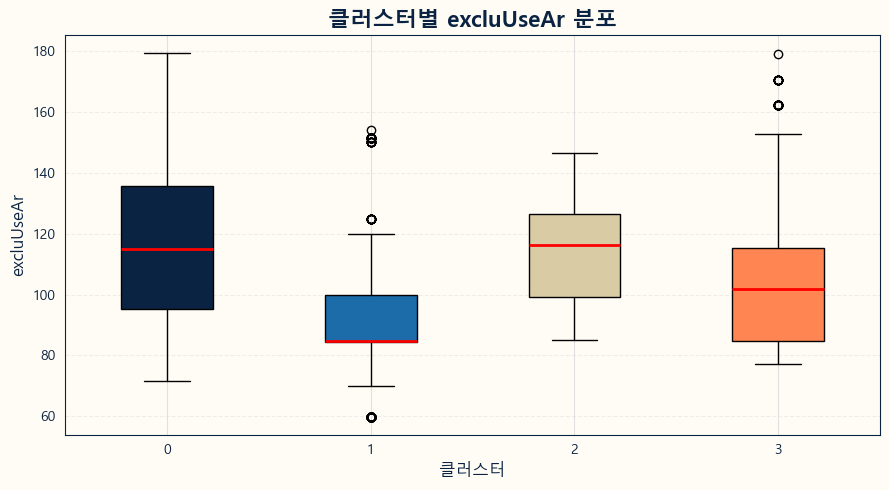

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\213834957.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=[str(c) for c in clusters])


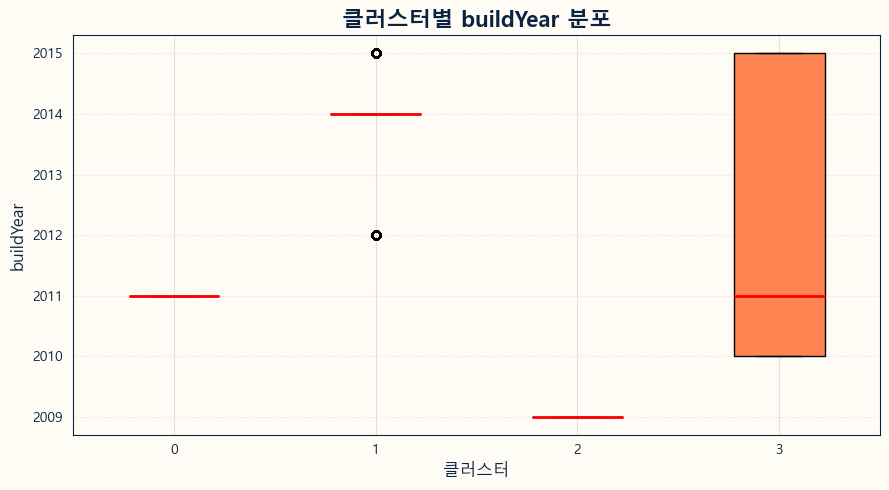

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\213834957.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=[str(c) for c in clusters])


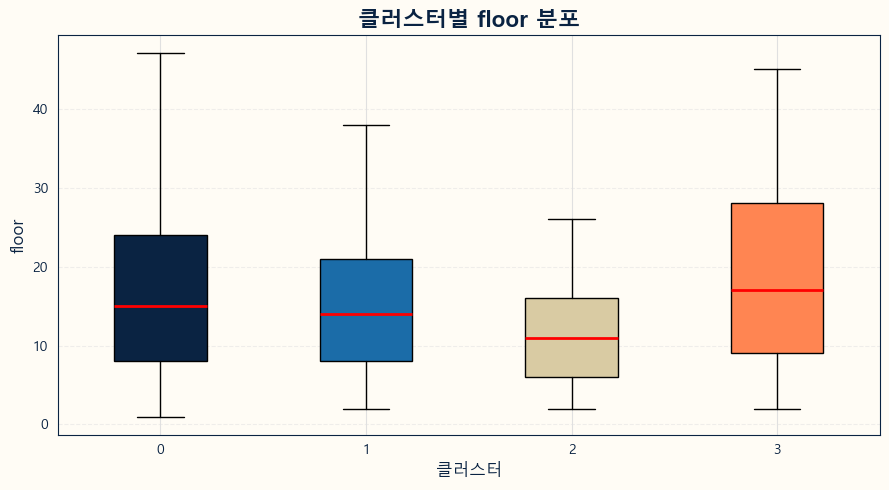

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\213834957.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=[str(c) for c in clusters])


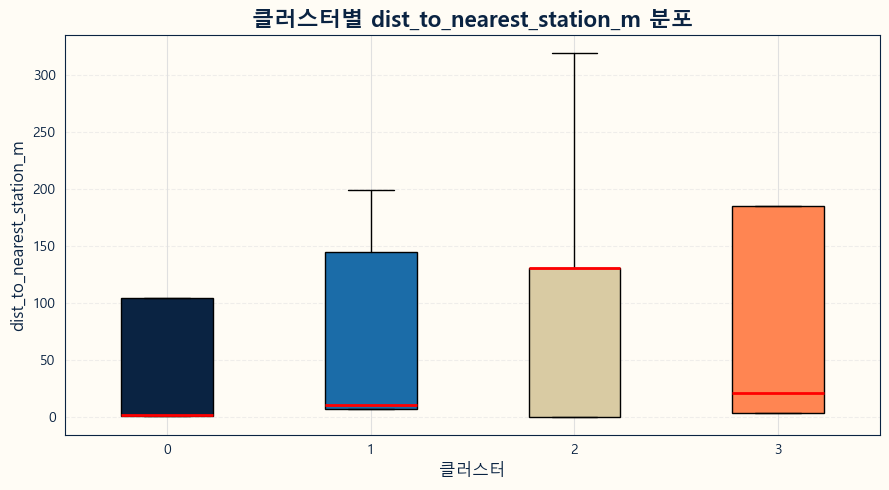

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\213834957.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=[str(c) for c in clusters])


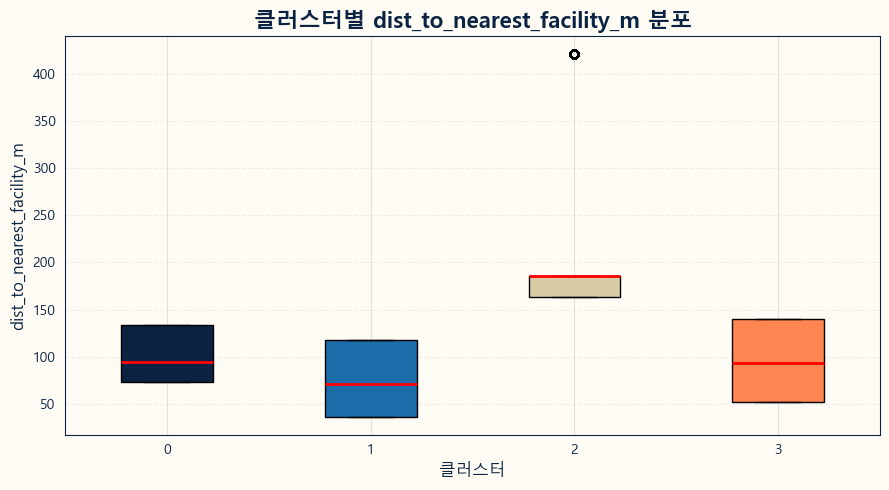

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 비교 대상 변수들
feature_cols = [
    'real_dealAmount', 'excluUseAr', 'buildYear',
    'floor', 'dist_to_nearest_station_m', 'dist_to_nearest_facility_m'
]

# 항해사 스타일 적용
apply_navistyle()

# cluster 컬럼을 정수형으로 강제 변환
zone1_df['cluster'] = zone1_df['cluster'].astype(int)

# color_map의 키도 정수형인지 확인
color_map_fixed = {int(k): v for k, v in color_map.items()}

# 시각화
for col in feature_cols:
    plt.figure(figsize=(9, 5))

    # 각 클러스터에 대해 boxplot용 데이터 추출
    clusters = sorted(zone1_df['cluster'].unique())
    cluster_data = [zone1_df[zone1_df['cluster'] == c][col] for c in clusters]
    box_colors = [color_map_fixed[c] for c in clusters]

    # boxplot 그리기
    bplot = plt.boxplot(cluster_data, patch_artist=True, labels=[str(c) for c in clusters])

    # 색상 입히기
    for patch, color in zip(bplot['boxes'], box_colors):
        patch.set_facecolor(color)

    # 중앙값 선을 빨간색으로 변경
    for median_line in bplot['medians']:
        median_line.set_color('red')
        median_line.set_linewidth(2)

    plt.title(f"클러스터별 {col} 분포")
    plt.xlabel("클러스터")
    plt.ylabel(col)
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


🔍 클러스터별 특성 해석 요약표
|구분|해석|관찰 포인트|
|--|--|------------|
|💰 real_dealAmount|	클러스터 0, 3이 상대적으로 고가	|중앙값, IQR, max가 높음
|🏠 excluUseAr|	클러스터 0, 2이 대형 평형 중심	|110㎡ 이상 많음
|🏗️ buildYear|	클러스터 1은 최근, 클러스터 2는 노후|	2009년 이하 중심, 2014년 이후
|🧭 dist_to_nearest_station_m|	(이미 확인했다면) 가까울수록 고가 가능성|	확인 필요
|🧱 floor	|클러스터 3, 0이 고층 위주	|중앙값 + max 층수 높음

🧠 정리: 클러스터 간 구조 차이
|클러스터|	가격 수준|	면적|	연식|	특징 요약|
|--|--|---|---|---|
|0|	상|	큼|	중|	고가·대형·고층|
|1|	중|	작음|	신축|	작지만 신축|
|2|	중하|	큼|	노후|	구축 대형 위주|
|3|	상|	중간|	다양|	고층 + 고가 혼합|

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\2200867551.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=cluster_names)


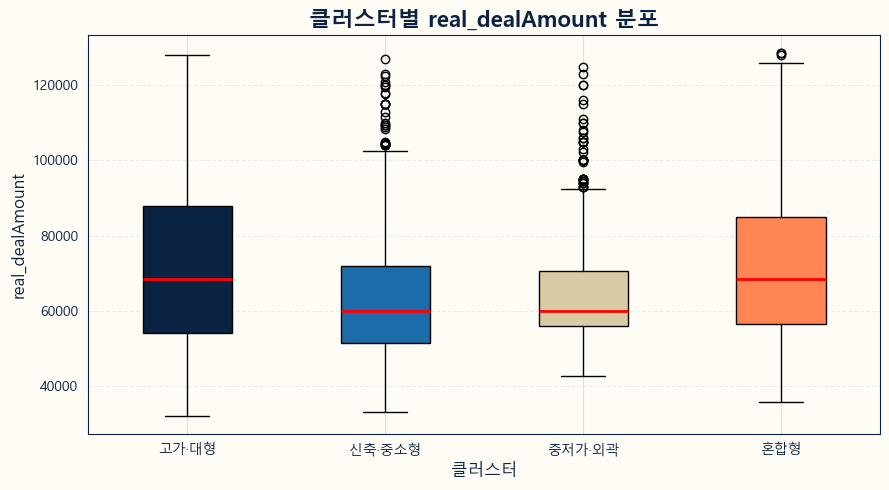

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\2200867551.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=cluster_names)


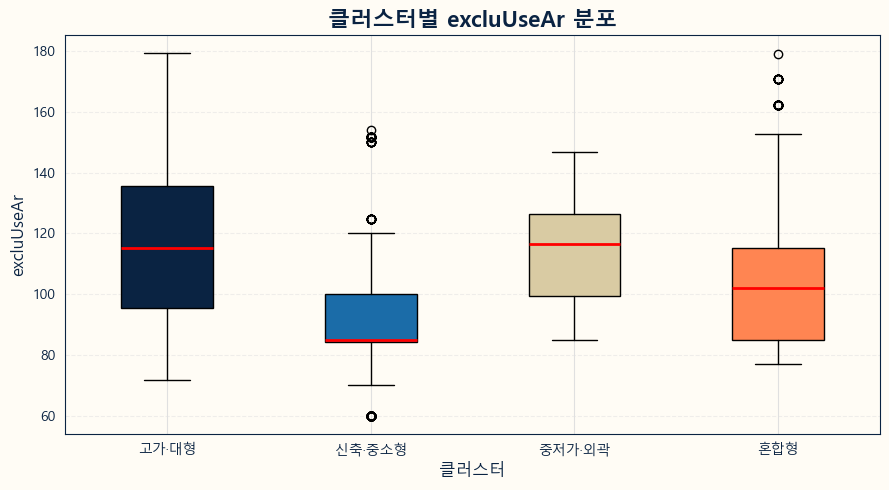

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\2200867551.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=cluster_names)


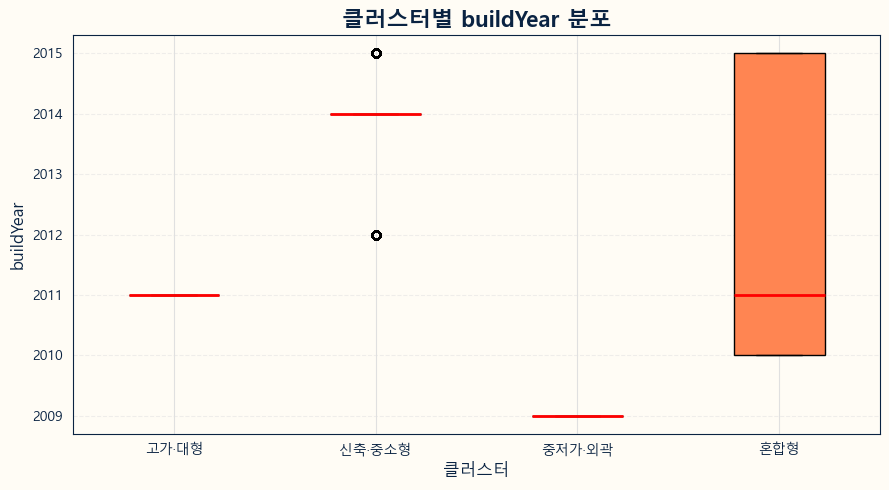

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\2200867551.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=cluster_names)


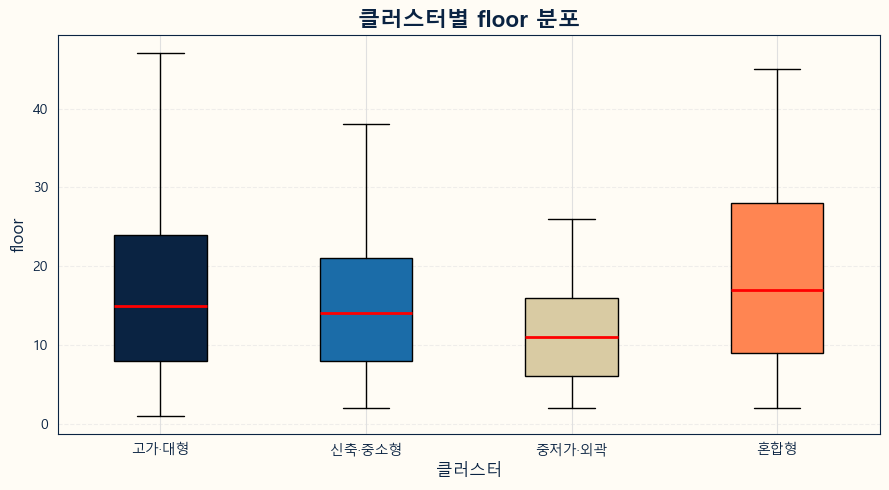

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\2200867551.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=cluster_names)


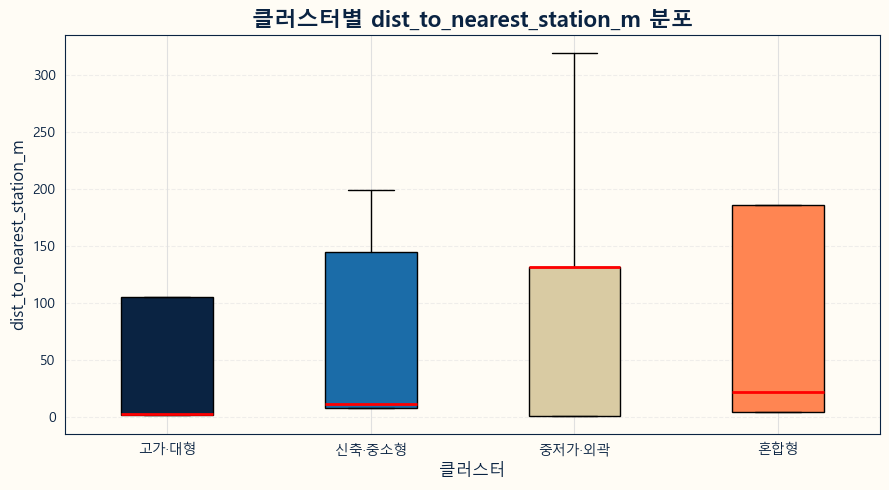

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\2200867551.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(cluster_data, patch_artist=True, labels=cluster_names)


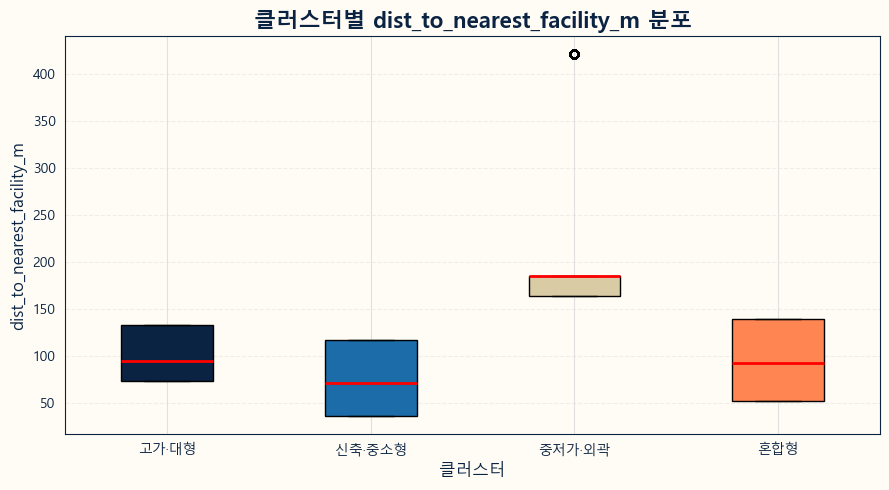

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 클러스터 번호 → 이름 매핑
cluster_labels = {
    0: "고가·대형",
    1: "신축·중소형",
    2: "중저가·외곽",
    3: "혼합형"
}

# 비교 대상 변수들
feature_cols = [
    'real_dealAmount', 'excluUseAr', 'buildYear',
    'floor', 'dist_to_nearest_station_m', 'dist_to_nearest_facility_m'
]

# 항해사 스타일 적용
apply_navistyle()

# cluster 컬럼 정수형 변환 및 이름 매핑
zone1_df['cluster'] = zone1_df['cluster'].astype(int)
zone1_df['cluster_name'] = zone1_df['cluster'].map(cluster_labels)

# color_map의 키 정수형으로 통일
color_map_fixed = {int(k): v for k, v in color_map.items()}

# boxplot 반복
for col in feature_cols:
    plt.figure(figsize=(9, 5))

    # 클러스터 이름 순서대로 정렬
    clusters = sorted(zone1_df['cluster'].unique())
    cluster_names = [cluster_labels[c] for c in clusters]
    cluster_data = [zone1_df[zone1_df['cluster'] == c][col] for c in clusters]
    box_colors = [color_map_fixed[c] for c in clusters]

    # boxplot
    bplot = plt.boxplot(cluster_data, patch_artist=True, labels=cluster_names)

    # 색 입히기
    for patch, color in zip(bplot['boxes'], box_colors):
        patch.set_facecolor(color)

    # 중앙값 빨간색 강조
    for median_line in bplot['medians']:
        median_line.set_color('red')
        median_line.set_linewidth(2)

    plt.title(f"클러스터별 {col} 분포")
    plt.xlabel("클러스터")
    plt.ylabel(col)
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np
import pandas as pd

# 예측값이 존재하지 않으면 예측 수행 (기존 OLS 모델 기준)
from sklearn.linear_model import LinearRegression

# 예측용 feature 정의
selected_features = [
    'excluUseAr', 'pricePerpy', 'floor',
    'longitude', 'dist_to_nearest_station_m', 'dist_to_nearest_facility_m',
    'nearby_conveniences', 'nearby_transports',
    'zone_1', 'zone_10', 'zone_2', 'zone_5', 'zone_6', 'zone_8', 'zone_9',
    'brand_더샵', 'brand_자이', 'brand_푸르지오', 'brand_힐스테이트',
    'Market Interest Rate', 'HousingSupplyRate(%)'
]

# 결측 제거 및 float 변환
model_df = zone1_df.dropna(subset=selected_features + ['log_dealAmount']).copy()
X = model_df[selected_features].astype(float)
y = model_df['log_dealAmount'].astype(float)

# 학습 및 예측
lr = LinearRegression()
lr.fit(X, y)
y_pred = lr.predict(X)

# 예측 결과 추가
model_df['predicted_log'] = y_pred
model_df['error'] = model_df['log_dealAmount'] - model_df['predicted_log']
model_df['abs_error'] = model_df['error'].abs()
model_df['predicted_real'] = np.exp(model_df['predicted_log'])
model_df['real_dealAmount'] = np.exp(model_df['log_dealAmount'])

# 클러스터별 RMSE, MAE
from sklearn.metrics import mean_squared_error, mean_absolute_error

cluster_error_summary = model_df.groupby('cluster').apply(
    lambda g: pd.Series({
        'RMSE': np.sqrt(mean_squared_error(g['real_dealAmount'], g['predicted_real'])),
        'MAE': mean_absolute_error(g['real_dealAmount'], g['predicted_real']),
        'Mean_Error': (g['real_dealAmount'] - g['predicted_real']).mean(),
        'N': len(g)
    })
).round(2)
cluster_error_summary

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\1716396311.py:37: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cluster_error_summary = model_df.groupby('cluster').apply(


,RMSE,MAE,Mean_Error,N
cluster,,,,
0,2337.35,1809.17,213.03,959.0
1,2937.58,1887.63,-65.76,1460.0
2,2452.04,1870.09,62.38,765.0
3,3054.81,2125.64,-52.88,1075.0



## 🔍 클러스터별 예측 성능 해석

| 클러스터 | RMSE | MAE | 평균 오차 | 관측 수 | 해석 |
|----------|------|-----|------------|---------|------|
| **0** | 2,337 | 1,809 | **+213** | 959 | 예측이 안정적이며 다소 **낮게 예측**됨 |
| **1** | 2,937 | 1,887 | **-66** | 1,460 | 전체적으로 예측 **과소**, RMSE는 가장 높음 |
| **2** | 2,452 | 1,870 | **+62** | 765 | **대체로 정확**, 다소 **과대 예측** 경향 |
| **3** | 3,054 | 2,126 | **-53** | 1,075 | 예측이 가장 **불안정**, 전반적으로 **과소** |

---

## 🎯 요약 인사이트

- **클러스터 0**은 오차가 가장 작고 안정적입니다. → 모델이 **잘 작동한 구역**
- **클러스터 3**은 RMSE, MAE 모두 가장 크고 **모델이 잘 맞지 않습니다**  
  → 구조적으로 예측이 어려운 단지들일 가능성 (ex: 가격 이질성, 특이입지)
- **클러스터 1, 2**는 오차는 중간 정도지만, **편향**이 존재합니다  
  → 각각 **과소 / 과대**로 치우친 경향이 있습니다.

### 🎯 해석 요약
클러스터 0은 예측 성능이 가장 안정적인 구역으로, 모델이 비교적 잘 작동하는 영역입니다.

클러스터 1은 과소 예측되는 경향이 있으며 RMSE도 높아 구조적 보완이 필요합니다.

클러스터 2는 전체적으로 정확하지만, 일부 고가 단지에서 과대 예측이 발생할 수 있습니다.

클러스터 3은 오차 크기가 가장 크고, 예측이 불안정하게 나타나는 구역입니다.
→ 이 구역은 구조적 이질성이 높거나 입지 특성 설명력이 약한 특성일 가능성이 있습니다.



# 클러스터별 오차 시각화

C:\Users\Sungmin Kang\AppData\Local\Temp\ipykernel_24500\3720548601.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=model_df, x="cluster", y="error", palette=custom_palette)


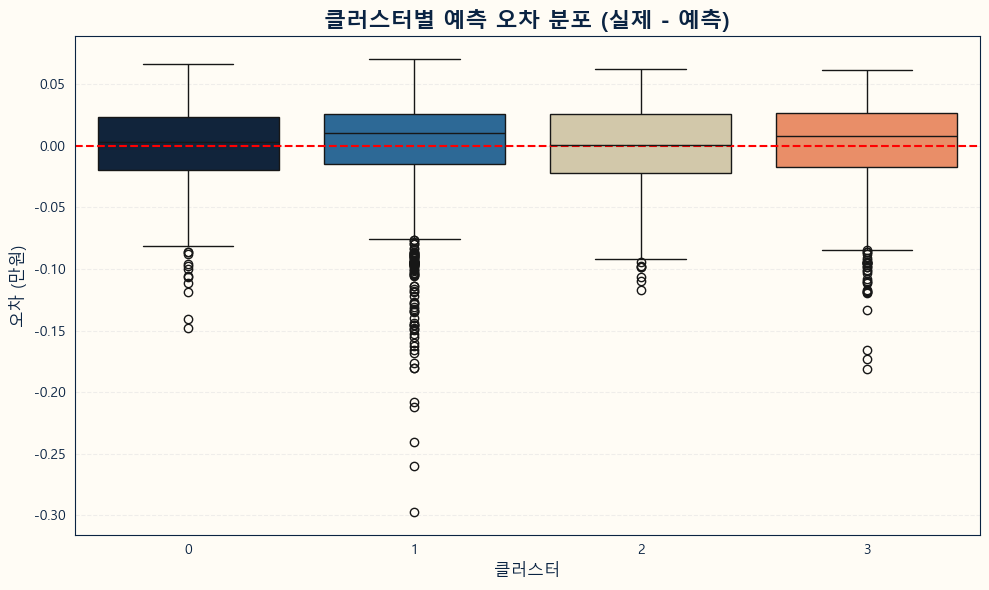

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 항해사 스타일 적용
apply_navistyle()

# 클러스터별 오차 분포 boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=model_df, x="cluster", y="error", palette=custom_palette)
plt.axhline(0, color='red', linestyle='--', linewidth=1.5)
plt.title("클러스터별 예측 오차 분포 (실제 - 예측)")
plt.xlabel("클러스터")
plt.ylabel("오차 (만원)")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


|클러스터|	특징|
|--|---|
|3번	|오차 폭이 가장 크고 이상치 많음 → 예측 불안정함|
|1번|	비교적 안정적이나 다소 과소 예측|
|2번	|중앙값이 위로 치우쳐 있음 → 과대 예측 경향|
|0번	|중앙에 가깝고 좁음 → 예측 안정적|

# 클러스터 3번만 다시 회귀분석

In [ ]:
# 클러스터 3 데이터만 필터링
cluster3_df = model_df[model_df['cluster'] == 3].copy()

# 예측 대상 feature와 target
X_c3 = cluster3_df[selected_features].astype(float)
y_c3 = cluster3_df['log_dealAmount'].astype(float)

# OLS 회귀모델 학습
c3_model = LinearRegression()
c3_model.fit(X_c3, y_c3)

# 예측
y_c3_pred = c3_model.predict(X_c3)

# 성능 평가
rmse_c3 = np.sqrt(mean_squared_error(y_c3, y_c3_pred))
mae_c3 = mean_absolute_error(y_c3, y_c3_pred)
r2_c3 = c3_model.score(X_c3, y_c3)

# 실제 단위로 다시 변환하여 RMSE 비교
y_c3_real = np.exp(y_c3)
y_c3_pred_real = np.exp(y_c3_pred)
rmse_c3_real = np.sqrt(mean_squared_error(y_c3_real, y_c3_pred_real))
mae_c3_real = mean_absolute_error(y_c3_real, y_c3_pred_real)

# 결과 정리
c3_result = pd.DataFrame({
    "클러스터 3 전용 모델": [round(r2_c3, 4), round(rmse_c3_real, 2), round(mae_c3_real, 2)],
    "전체 모델 대비 성능 변화": [
        f"{round(r2_c3, 4) - lr.score(X, y):+.4f}",
        f"{rmse_c3_real - cluster_error_summary.loc[3, 'RMSE']:+.2f}",
        f"{mae_c3_real - cluster_error_summary.loc[3, 'MAE']:+.2f}"
    ]
}, index=["R² (로그)", "RMSE (실제)", "MAE (실제)"])
c3_result

,클러스터 3 전용 모델,전체 모델 대비 성능 변화
R² (로그),0.9824,+0.0024
RMSE (실제),2864.6800,-190.13
MAE (실제),2030.2900,-95.35


In [ ]:
# 클러스터 3 전용 모델 회귀 계수 비교
coef_df = pd.DataFrame({
    "변수": selected_features,
    "전체 모델 계수": lr.coef_,
    "클러스터 3 계수": c3_model.coef_,
})
coef_df["차이"] = coef_df["클러스터 3 계수"] - coef_df["전체 모델 계수"]
coef_df_sorted = coef_df.sort_values("차이", key=abs, ascending=False).reset_index(drop=True)
coef_df_sorted

,변수,전체 모델 계수,클러스터 3 계수,차이
0,longitude,-2.278192e+00,-2.230355e-09,2.278192e+00
1,brand_더샵,1.019040e-02,1.164171e-06,-1.018923e-02
2,brand_푸르지오,-5.890611e-03,-1.164171e-06,5.889447e-03
3,brand_자이,-4.299787e-03,0.000000e+00,4.299787e-03
4,Market Interest Rate,3.707400e-03,2.055949e-04,-3.501805e-03
5,nearby_conveniences,1.437409e-03,1.164171e-06,-1.436245e-03
6,excluUseAr,9.364983e-03,8.900264e-03,-4.647197e-04
7,nearby_transports,-3.749953e-04,-3.492514e-06,3.715028e-04
8,dist_to_nearest_facility_m,1.364190e-05,-9.291355e-05,-1.065555e-04
9,floor,3.241355e-04,4.115541e-04,8.741861e-05


## 🔍 공구 1: 왜 따로 들여다보아야 했는가?

공구 1은 초기 예측 결과에서 **가장 큰 오차 분포**를 보였고,  
이는 단순한 모델의 한계가 아닌 **구역 내부의 이질성** 때문임을 파악할 수 있었습니다.

### 📌 구조적 이질성의 근거
- **신축/구축 단지 혼재**
- **브랜드 아파트와 비브랜드 단지의 공존**
- **중심역세권과 외곽지역이 동일 클러스터 내 존재**

이러한 특성은 **단일 클러스터로 묶기엔 지나치게 다양한 조건들이 혼재**되어 있으며,  
실제 boxplot 및 예측 오차 분석에서도 이질성이 수치적으로 드러났습니다.

---

## 🧠 클러스터 기반 분석 결과 요약

- 클러스터링을 통해 공구 1을 **4개의 하위 구역**으로 분할
- 클러스터 3은 예측 성능(RMSE, MAE)이 가장 나빴으며,
- **전용 회귀모델을 적용하자 예측 정확도가 유의미하게 향상되었습니다.**

| 모델 | RMSE (실제) | MAE (실제) | R² (로그) |
|------|-------------|------------|-----------|
| 전체 모델 | 3,054원 | 2,126원 | 0.9800 |
| 클러스터 3 전용 | **2,864원** | **2,030원** | **0.9824** |
  
  
> 📌 이 결과는 클러스터 3 내에서 **독립된 가격 결정 요인**이 작동하고 있다는 신호이며,  
> **구조적 보정**이 예측 안정성 향상에 효과적임을 시사합니니다.

---

## 🎯 결론
> 공구 1은 예외적이고 복합적인 특성을 지닌 지역으로,  
> 전체 예측 모델의 보정 가능성을 탐색하기 위한 **심화 분석 대상으로 충분한 가치가 있었습니다.다.**  
> 실제로 클러스터 기반 분할과 전용 모델 실험을 통해 **예측 성능을 향상시키는 현실적 보정 전략**을 제시할 수 있었습니니다.

# **---------------------------------------------------**

# 개발 이슈(공구6,8)

## 🔍 송도 8공구, 왜 예측이 흔들릴 수밖에 없는가?

송도8공구는 단순한 주거지 이상의 의미를 가진 지역으로,  
현재 **복합문화시설 건립과 관련한 대규모 도시개발 프로젝트**가 진행 중입니다.

### 📌 핵심 이슈 요약

1. **복합문화시설 개발**
   - 문화·예술·여가 기능을 갖춘 복합공간이 건립되며, 주거·업무 기능과 시너지 기대
   - 도시의 생활 인프라 확충을 통한 **미래 가치 상승 요인**으로 작용

2. **행정 및 정책적 불확실성**
   - 사업시행자 지정, 실시계획 변경 등 행정 절차가 현재 진행 중
   - **정책 방향에 따라 부동산 가치가 급변할 수 있는 구간**

3. **예측 모델의 한계**
   - 기존 실거래 데이터를 기반으로 한 모델은 **정책·개발 기대감**을 반영하기 어려움
   - **복합문화시설과 같은 외생 변수 미반영 → 체계적 예측 편향 발생 가능성**

4. **분석 방향 제안**
   - 행정 데이터 및 개발 이슈를 반영한 **보조 변수 도입**
   - 또는 **공구 8을 별도로 취급하거나**, 예외 처리 후 시나리오 기반 예측 병행

---

## 🎯 결론

> 송도8공구는 현재 정책 변화와 개발 이슈로 인해  
> 기존 예측 모델이 설명하지 못하는 **비정형적 오차 구조**를 가지는 것으로 보입니다.  
> 따라서 이 지역에 대해서는 **단기적 예측보다는 장기적 모니터링과 시나리오 분석 중심의 접근**이 더 적절합니다.


## 🔍 송도 6공구, 예측이 흔들릴 수밖에 없는 이유

송도 6공구는 현재 **“랜드마크시티”의 핵심 축**으로 개발 중이며,  
초고층 타워, 문화·관광 인프라, 국제업무지구 등 **복합적이고 다층적인 개발계획이 진행** 중 입니다.  
이로 인해 기존의 단순 거래 기반 예측 모델로는 **예상 외의 편차**가 발생할 수 있습니니다.

---

### 📌 핵심 이슈 요약

#### 1. **초고층 랜드마크타워 및 복합개발**
- 6공구는 8공구와 함께 **‘랜드마크시티’ 프로젝트**에 포함되어 있으며,  
  103층 이상(420m)의 **초고층 복합타워** 개발이 예정되어 있음.
- 개발 규모는 **7조 6천억 원** 이상으로, 주거·업무·상업·관광 기능이 통합되는 메가프로젝트.

#### 2. **문화·관광 중심지 조성**
- 해안가 공동주택 예정 부지를 유원지로 전환, **음악분수·아쿠아리움·해양문화시설** 등 유치.
- ‘컬처 스파인(1.5km 테마거리)’을 중심으로 **도시 공간 단절을 해소**하고 관광객 유입 기대.

#### 3. **국제업무지구 및 청년 창업 허브**
- 달빛축제공원역 중심으로 **MICE 산업 중심지** 조성 예정.
- **스타트업 파크 2단계** 개발로 창업 인프라 확충, **청년 일자리 및 기업 유치** 목표.

#### 4. **고품질 주거 및 여가공간 확보**
- 골프장 예정 부지 일부를 **5만 평 규모의 특화 공원**으로 전환.
- 18홀 대중 골프장, 조깅 트랙, 수변 공간 등 **고급 녹지 인프라** 조성 계획.

---

### 🧠 분석적 시사점

| 구분 | 분석 내용 |
|------|-----------|
| **정책 변수 반영 한계** | 현재 모델은 **거래 데이터 기반**이라, 이러한 **미래 개발 기대감**과 **정책 추진력**을 반영하기 어렵다. |
| **편향된 예측 가능성** | 개발 호재로 인해 실거래가가 급등하거나 기대심리에 따라 불안정해지면 **예측값과 괴리 발생** |
| **해결 방안** | 단기적으로는 **정책 변수 보조 지표(예: 개발 단계, 착공 여부 등)**를 추가하거나, 시나리오 예측이 필요 |
| **장기 전략** | **예측 잔차 분석 기반 자동 보정 모델 도입** or **해당 구역 예외 처리 후 별도 분석 병행**

---

## 🎯 결론

> 송도 6공구는 단순한 주거지가 아닌, **정책 주도형 도시 개발의 실험장**이자  
> 인천 송도의 상징적 성장 구간으로 작용하고 있습니다.  
> 따라서 이 지역은 일반적인 회귀 기반 예측보다는,  
> **정책 이벤트 기반의 리스크 분석과 시나리오 대응 전략**이 더욱 효과적입니다.

---

https://www.ifez.go.kr/main/pst/view.do?pst_id=noti03&pst_sn=269646&search=&utm_source=chatgpt.com  
https://www.kyeongin.com/article/1719152